In [1]:
import DeepLabModel
import os, urllib
from PIL import Image
from io import BytesIO
import numpy as np
from skimage.io import imshow
import matplotlib.pyplot as plt
from ipywidgets import FloatSlider, interact, fixed, HBox, VBox, Label, Button, Output, IntProgress
plt.rcParams['figure.max_open_warning'] = False
import pandas as pd
from matplotlib import gridspec

### Load the models

In [2]:
def load_models():    
    _DOWNLOAD_URL_PREFIX = 'http://download.tensorflow.org/models/'
    model_dir = '../models/'
    _MODEL_URLS = {
        'mobilenetv2_coco_voctrainaug':
            'deeplabv3_mnv2_pascal_train_aug_2018_01_29.tar.gz',
        'mobilenetv2_coco_voctrainval':
            'deeplabv3_mnv2_pascal_trainval_2018_01_29.tar.gz',
        'xception_coco_voctrainaug':
            'deeplabv3_pascal_train_aug_2018_01_04.tar.gz',
        'xception_coco_voctrainval':
            'deeplabv3_pascal_trainval_2018_01_04.tar.gz',
    }
    models = dict()
    for modelname, tarname in _MODEL_URLS.items():
        download_path = os.path.join(model_dir, tarname)
        if not os.path.isfile(download_path):
            print('downloading {}, this might take a while...'.format(modelname))
            urllib.request.urlretrieve(_DOWNLOAD_URL_PREFIX + _MODEL_URLS[modelname],
                               download_path)
            print('download completed!')
            
        else:
            print("model already present at {}".format(download_path))
        
        print('Loading model {}...'.format(modelname))
        models[modelname] = DeepLabModel.DeepLabModel(download_path)
        print('{} loaded successfully!'.format(modelname))
    return models
models = load_models()

model already present at ../models/deeplabv3_pascal_trainval_2018_01_04.tar.gz
Loading model xception_coco_voctrainval...
xception_coco_voctrainval loaded successfully!
model already present at ../models/deeplabv3_mnv2_pascal_trainval_2018_01_29.tar.gz
Loading model mobilenetv2_coco_voctrainval...
mobilenetv2_coco_voctrainval loaded successfully!
model already present at ../models/deeplabv3_mnv2_pascal_train_aug_2018_01_29.tar.gz
Loading model mobilenetv2_coco_voctrainaug...
mobilenetv2_coco_voctrainaug loaded successfully!
model already present at ../models/deeplabv3_pascal_train_aug_2018_01_04.tar.gz
Loading model xception_coco_voctrainaug...
xception_coco_voctrainaug loaded successfully!


### Load the test dataset

In [ ]:
LABEL_NAMES = np.asarray([
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
])
FULL_LABEL_MAP = np.arange(len(LABEL_NAMES)).reshape(len(LABEL_NAMES), 1)
FULL_COLOR_MAP = DeepLabModel.label_to_color_image(FULL_LABEL_MAP)

def show_predictions(inputimg, predictions, target, unique_labels):
    max_cols = len(predictions)+3
    
    plt.figure(figsize=(15, 10))
    grid_spec = gridspec.GridSpec(1, max_cols, width_ratios= [6] + [6 for i in predictions.keys()]+ [6] + [2])
    # Show input
    plt.subplot(grid_spec[0])
    plt.imshow(inputimg)
    plt.axis('off')
    plt.title('Input')

    for p, (pname, pred) in enumerate(predictions.items()):
        plt.subplot(grid_spec[p+1])
        plt.imshow(DeepLabModel.label_to_color_image(pred).astype(np.uint8))
        plt.axis('off')
        plt.title('Model {}'.format(p+1))

    plt.subplot(grid_spec[max_cols-2])
    plt.imshow(DeepLabModel.label_to_color_image(target).astype(np.uint8))
    plt.axis('off')
    plt.title('Ground Truth')

    ax = plt.subplot(grid_spec[max_cols-1])
    plt.imshow(
        FULL_COLOR_MAP[unique_labels].astype(np.uint8), interpolation='nearest')
    ax.yaxis.tick_right()
    plt.yticks(range(len(unique_labels)), LABEL_NAMES[unique_labels])
    plt.xticks([], [])
    ax.tick_params(width=0.0)
    plt.grid('off')
    plt.show()


def get_next_sample():
    dataset_path = "/home/datasets/VOCdevkit/VOC2012/ImageSets/Segmentation/val.txt"
    sample_folder="/home/datasets/VOCdevkit/VOC2012/JPEGImages/"
    target_folder="/home/datasets/VOCdevkit/VOC2012/SegmentationClass/"
    with open(dataset_path, 'r') as index:
        basenames = [str.strip(l) for l in index.readlines()]
        samples_path = [sample_folder+b+'.jpg' for b in basenames]
        target_path = [target_folder+b+'.png' for b in basenames]
    print("Loading {} sample/target pairs".format(len(samples_path)))
    for s, l in zip(samples_path, target_path):
        sample = Image.open(s)
        label = Image.open(l)
        yield sample, label

### Define metrics and evaluation

In [ ]:
def test_models(display_predictions=False, maxsamples=1449):
    
    next_sample = get_next_sample()
    
    # Define dataframes where to store data
    df = {m: {label: pd.DataFrame(columns=["TN", "FP", "TP", "FN"]) for label in LABEL_NAMES} for m in models.keys()}
    
    for s, (sample, target) in enumerate(next_sample):
        print("Processing sample {} of {}".format(s+1, maxsamples))
        labels = set() # Every label that is present in predictions/gt
        predictions = dict()
        # Generate predictions
        for m, modelname in enumerate(models.keys()):
            model = models[modelname]
            _, prediction = model.run(sample)
            predictions[modelname] = prediction

        # Resize target to make it compatible with prediction
        target = np.array(target.resize(prediction.shape[::-1], Image.NEAREST)) if not isinstance(target, np.ndarray) else target
        # Finding all the unique labels in both predictions and ground truth
        unique_labels = np.array([], dtype=np.int)
        gt_labels = np.unique(target)
        for modelname, p in predictions.items():
            unique_labels = np.union1d(unique_labels, np.unique(p))
        unique_labels = np.union1d(unique_labels, gt_labels)
        unique_labels = unique_labels[unique_labels!=255] # We ignore the void label (see VOC2012 docs)
        if display_predictions:
            show_predictions(sample, predictions, target, unique_labels)
        
        for l in unique_labels:
            for m, modelname in enumerate(models.keys()):
                P = predictions[modelname]==l
                T = target==l
                tp = np.count_nonzero(np.logical_and(T, P))
                tn = np.count_nonzero(np.logical_and(np.logical_not(T),np.logical_not(P)))
                fp = np.count_nonzero(np.logical_and(T,np.logical_not(P)))
                fn = np.count_nonzero(np.logical_and(np.logical_not(T),P))
                # Write the values in the correct dataframe
                df[modelname][LABEL_NAMES[l]].loc[s] = [tn, fp, tp, fn]
     
    print("Saving Data...")
    # Save dataframes
    for modelname, modeldfs in df.items():
        for labelname, dataframe in modeldfs.items():
            folder = 'stats_from_dataset/{}/'.format(modelname)
            os.makedirs(folder, exist_ok=True)
            dataframe.to_csv(folder+'{}.csv'.format(labelname))
    print("Done")

### Generate .csv
A stats_from_dataset folder is created, containing a subfolder for each model. In this subfolder you can find a csv for each label, containing the count of true-positive, false-positive, true-negative, false-negative for each sample that has been used (the first column is the sample index).

In order to display some predictions from the dataset, se the display_predictions parameter to True (displays a graph for each sample..)

Loading 1449 sample/target pairs
Processing sample 1 of 1449


/usr/local/lib/python3.5/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


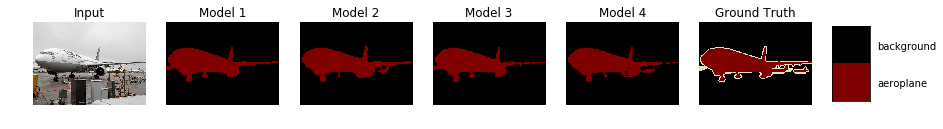

Processing sample 2 of 1449


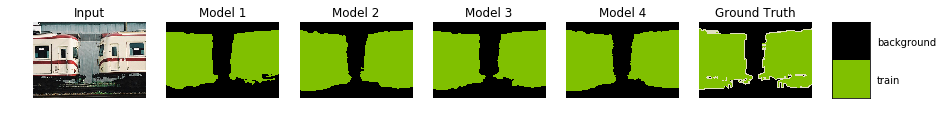

Processing sample 3 of 1449


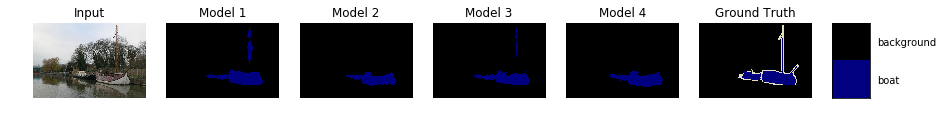

Processing sample 4 of 1449


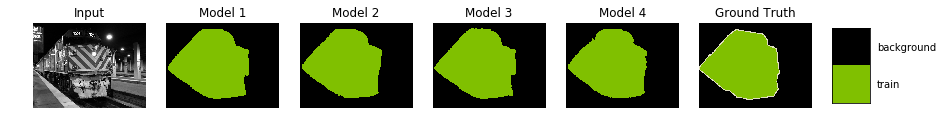

Processing sample 5 of 1449


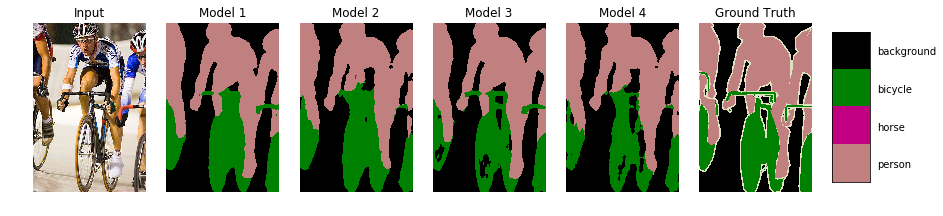

Processing sample 6 of 1449


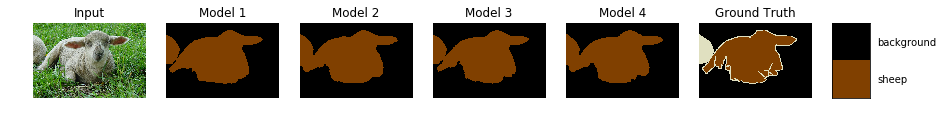

Processing sample 7 of 1449


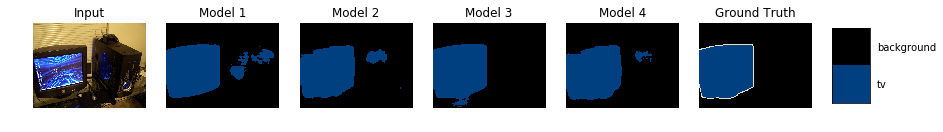

Processing sample 8 of 1449


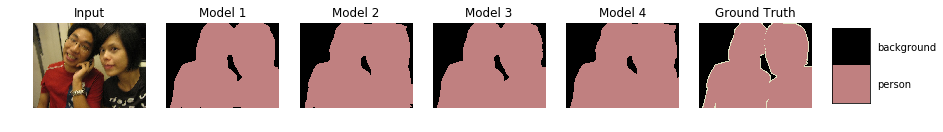

Processing sample 9 of 1449


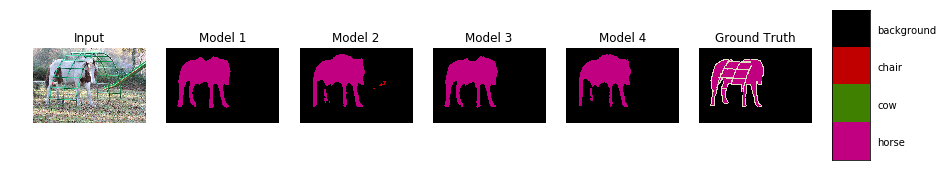

Processing sample 10 of 1449


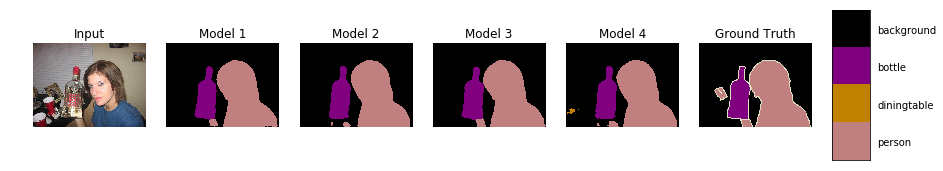

Processing sample 11 of 1449


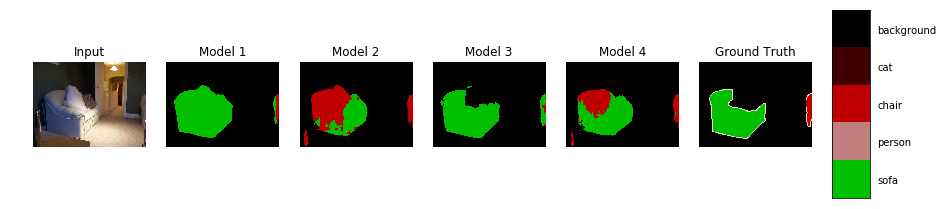

Processing sample 12 of 1449


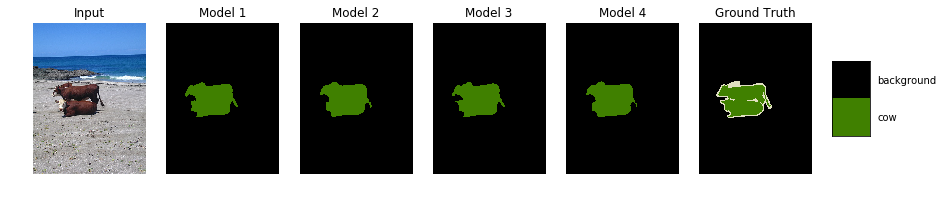

Processing sample 13 of 1449


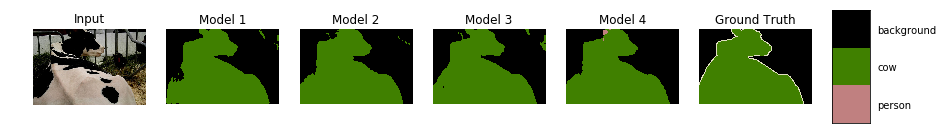

Processing sample 14 of 1449


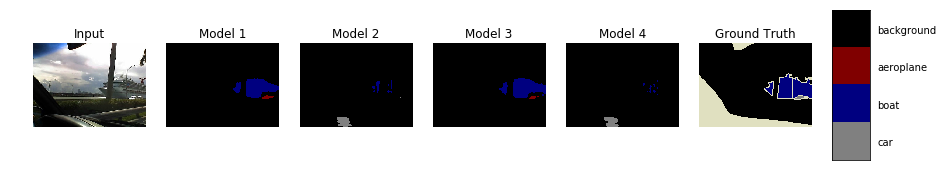

Processing sample 15 of 1449


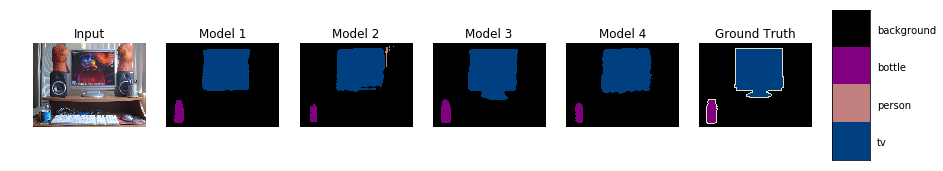

Processing sample 16 of 1449


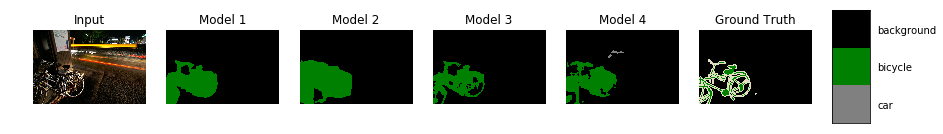

Processing sample 17 of 1449


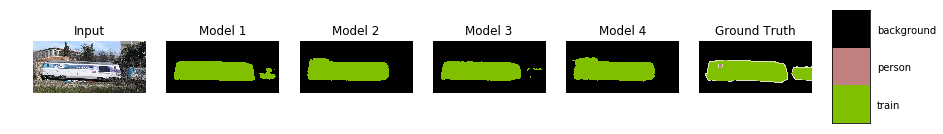

Processing sample 18 of 1449


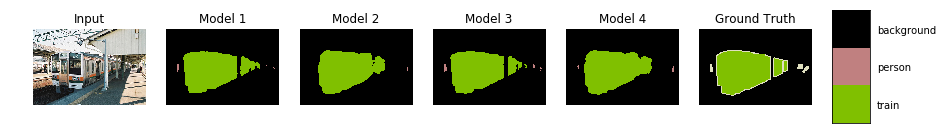

Processing sample 19 of 1449


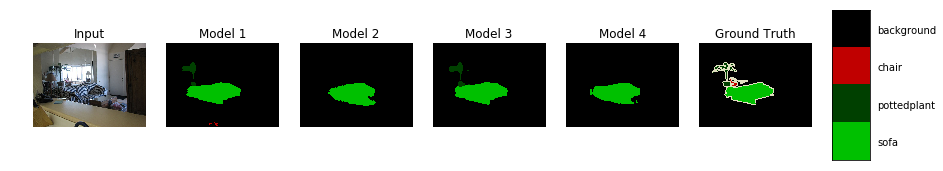

Processing sample 20 of 1449


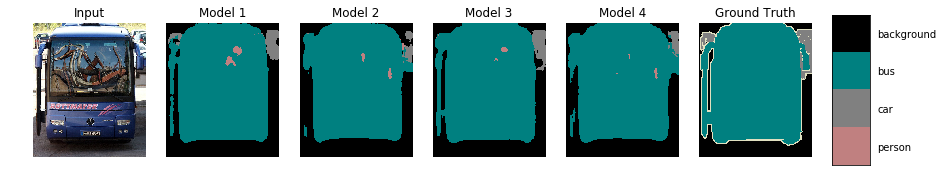

Processing sample 21 of 1449


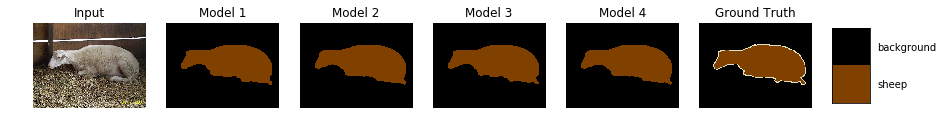

Processing sample 22 of 1449


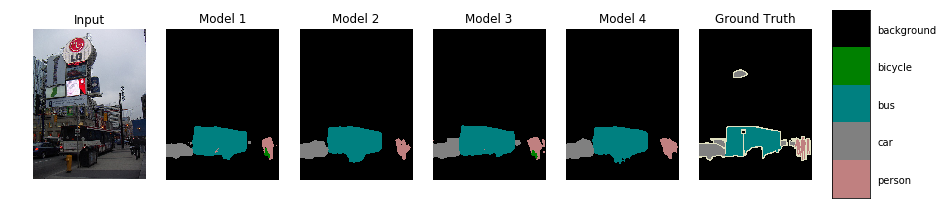

Processing sample 23 of 1449


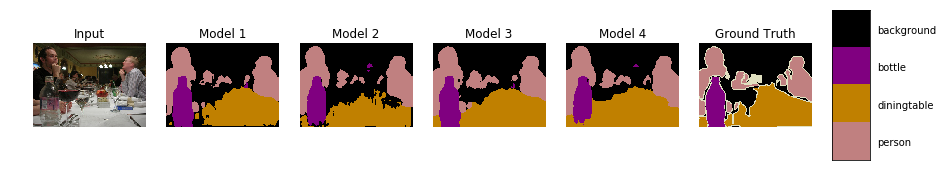

Processing sample 24 of 1449


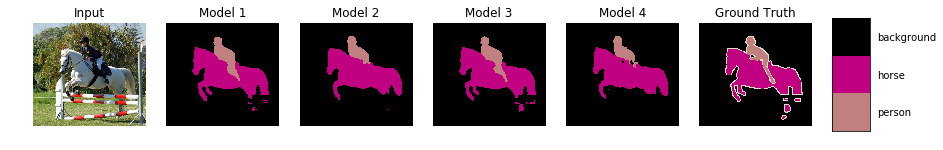

Processing sample 25 of 1449


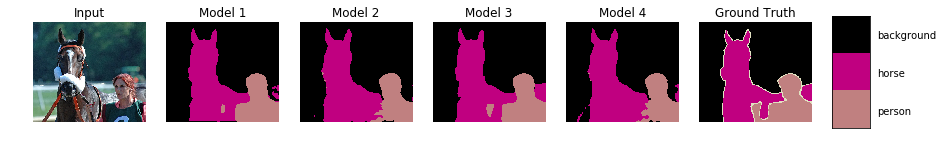

Processing sample 26 of 1449


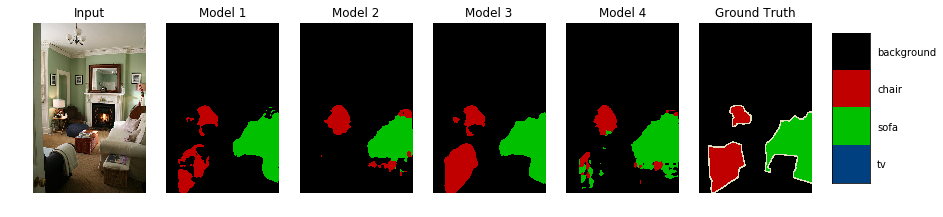

Processing sample 27 of 1449


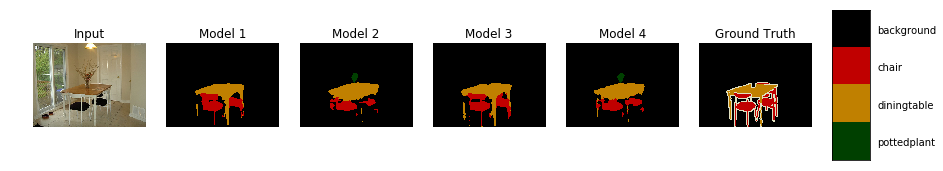

Processing sample 28 of 1449


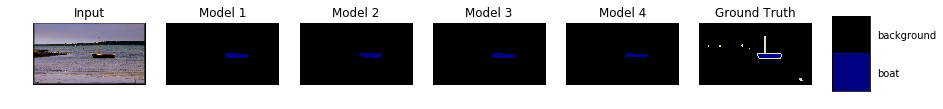

Processing sample 29 of 1449


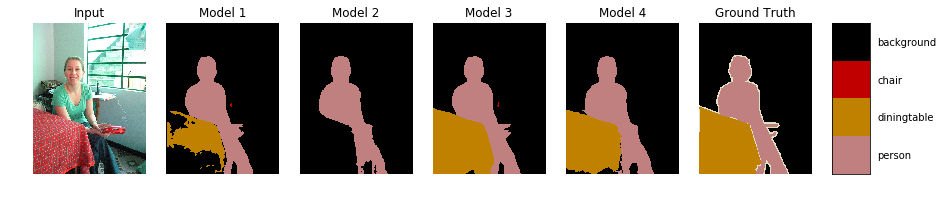

Processing sample 30 of 1449


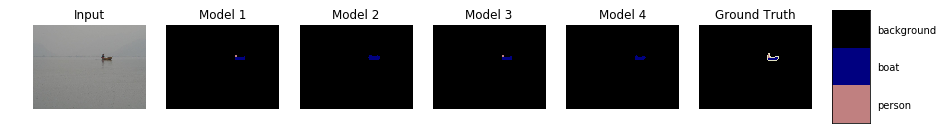

Processing sample 31 of 1449


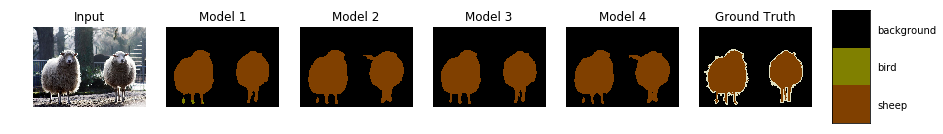

Processing sample 32 of 1449


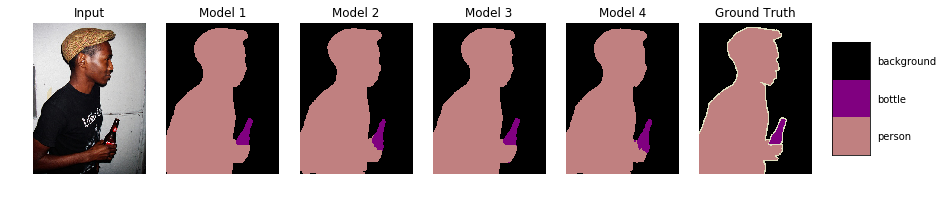

Processing sample 33 of 1449


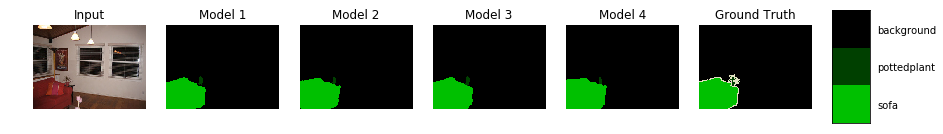

Processing sample 34 of 1449


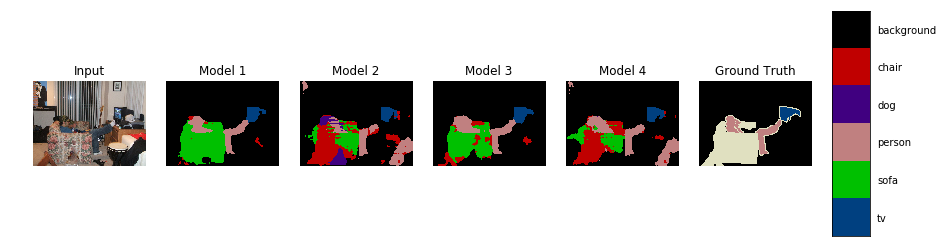

Processing sample 35 of 1449


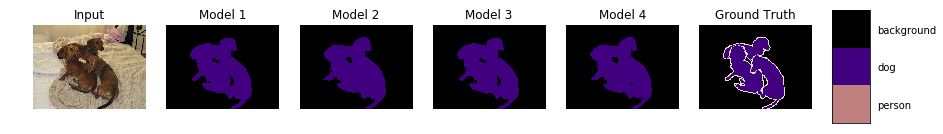

Processing sample 36 of 1449


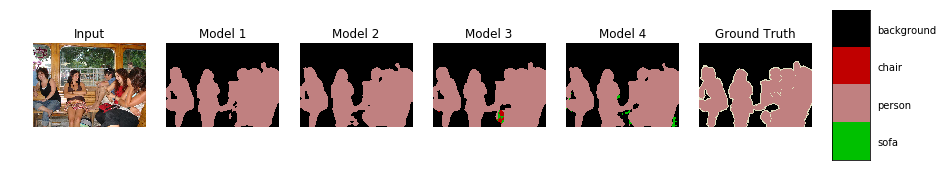

Processing sample 37 of 1449


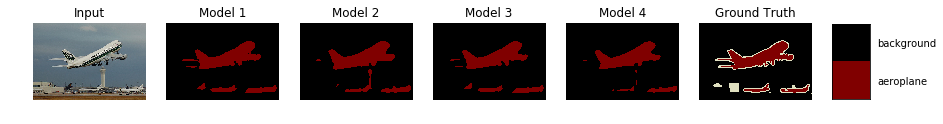

Processing sample 38 of 1449


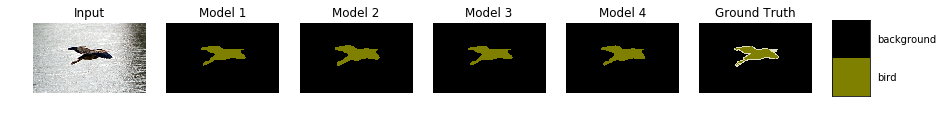

Processing sample 39 of 1449


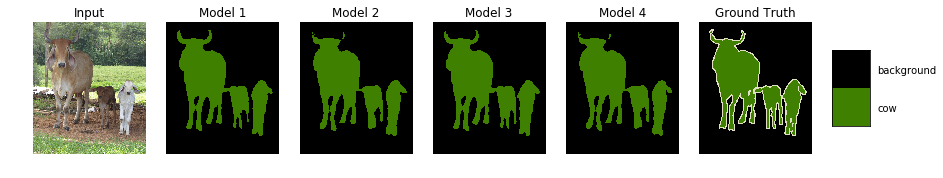

Processing sample 40 of 1449


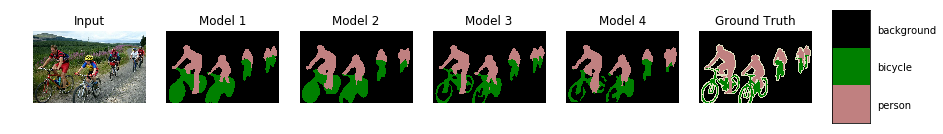

Processing sample 41 of 1449


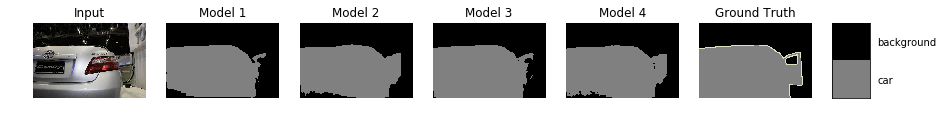

Processing sample 42 of 1449


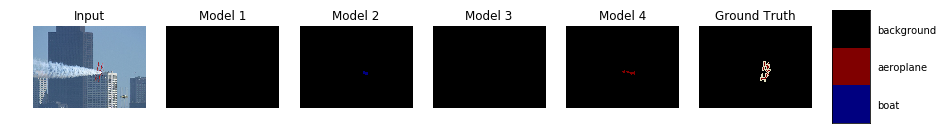

Processing sample 43 of 1449


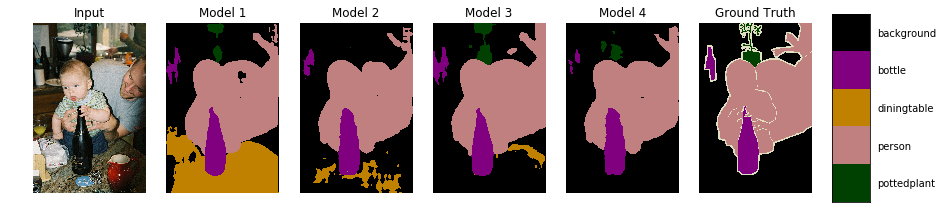

Processing sample 44 of 1449


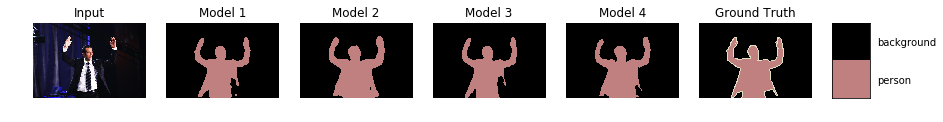

Processing sample 45 of 1449


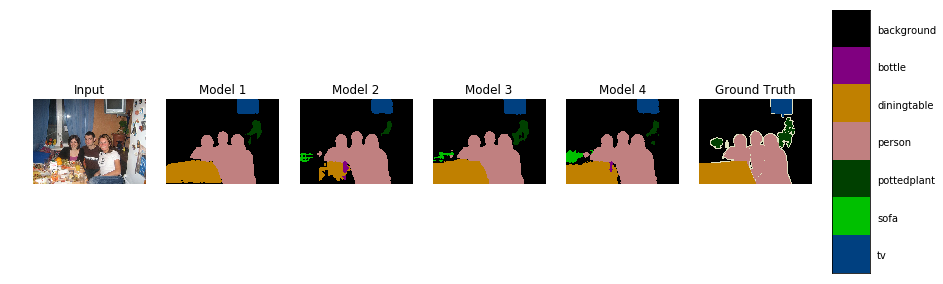

Processing sample 46 of 1449


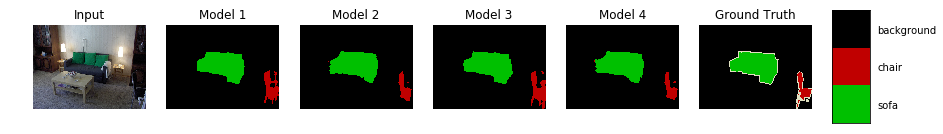

Processing sample 47 of 1449


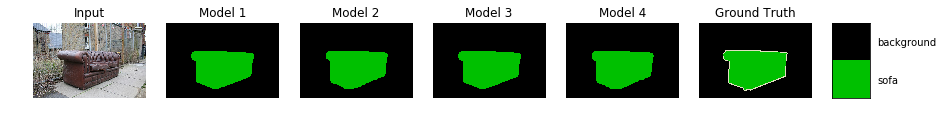

Processing sample 48 of 1449


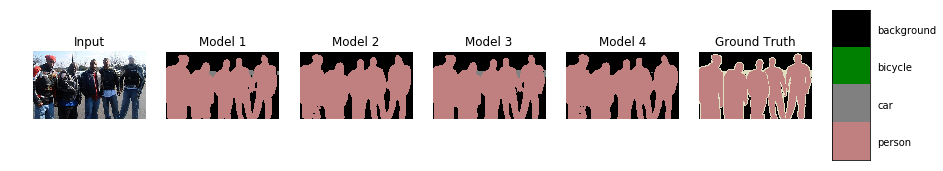

Processing sample 49 of 1449


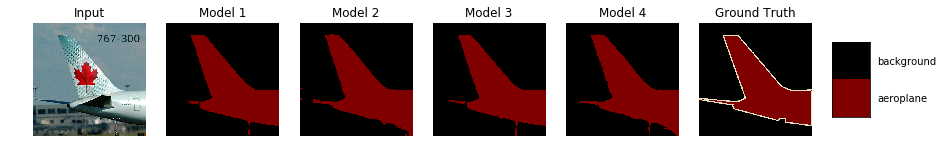

Processing sample 50 of 1449


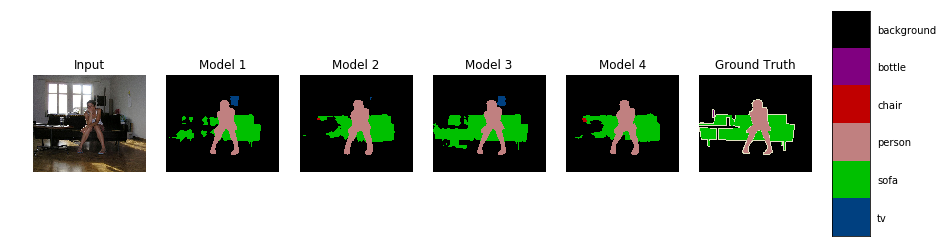

Processing sample 51 of 1449


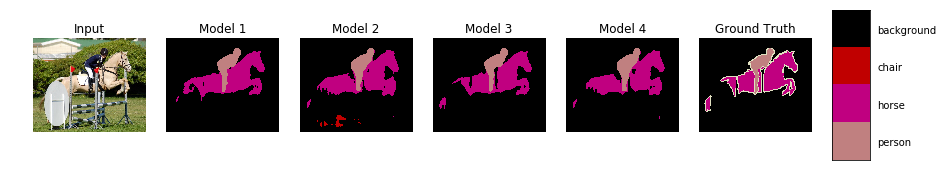

Processing sample 52 of 1449


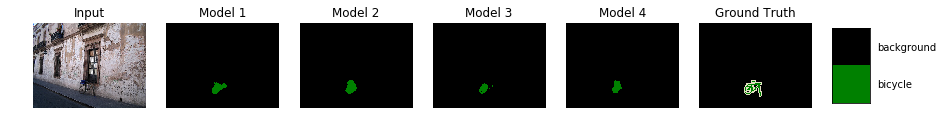

Processing sample 53 of 1449


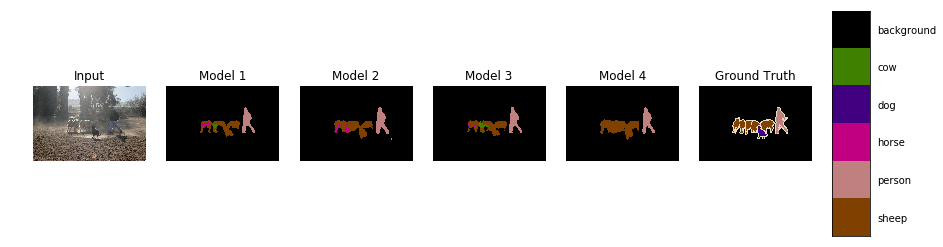

Processing sample 54 of 1449


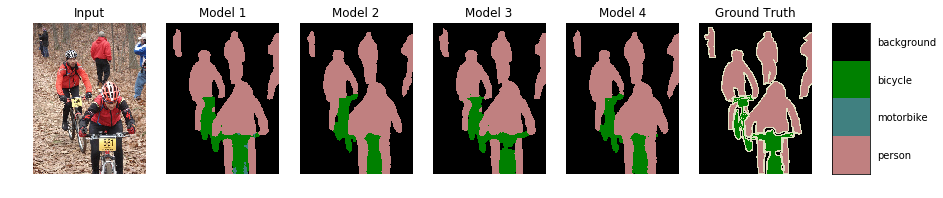

Processing sample 55 of 1449


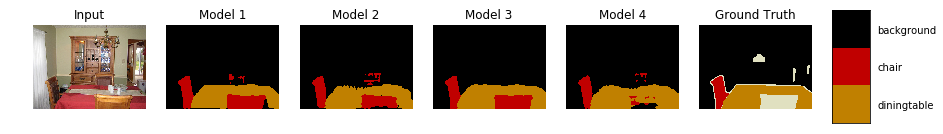

Processing sample 56 of 1449


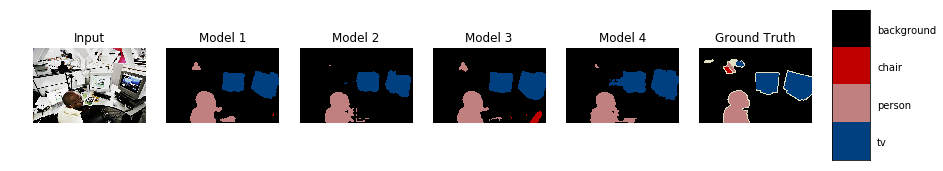

Processing sample 57 of 1449


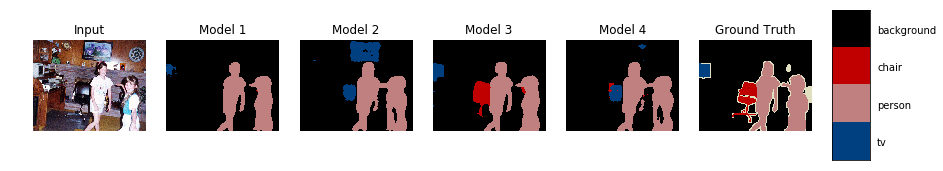

Processing sample 58 of 1449


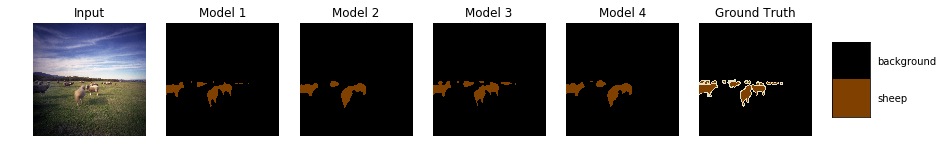

Processing sample 59 of 1449


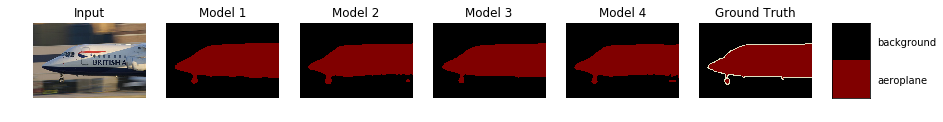

Processing sample 60 of 1449


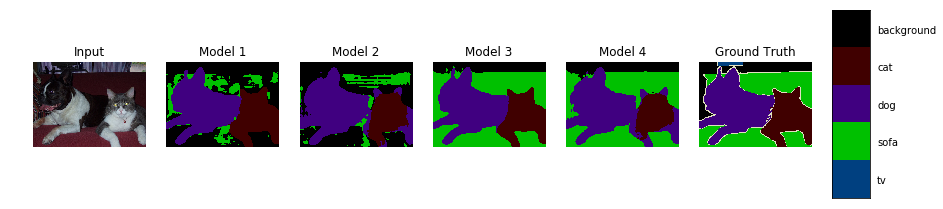

Processing sample 61 of 1449


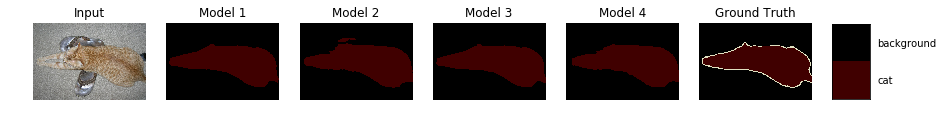

Processing sample 62 of 1449


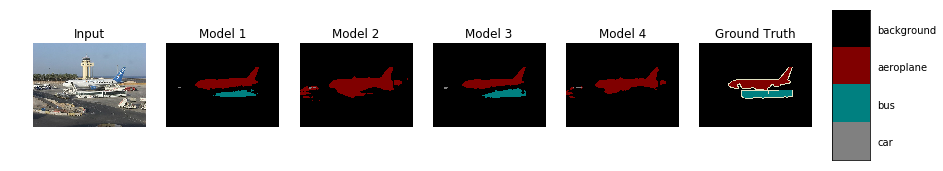

Processing sample 63 of 1449


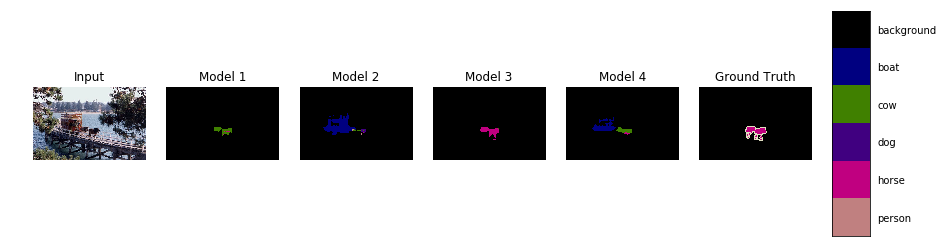

Processing sample 64 of 1449


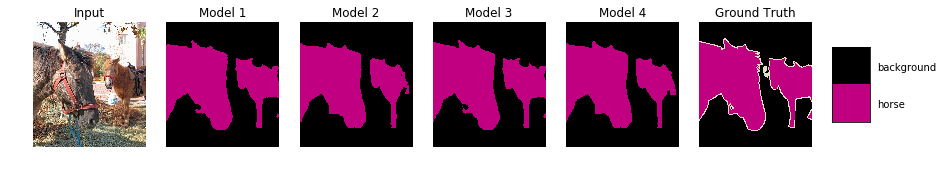

Processing sample 65 of 1449


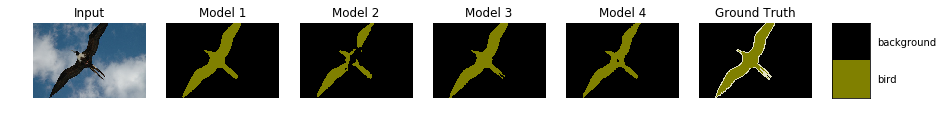

Processing sample 66 of 1449


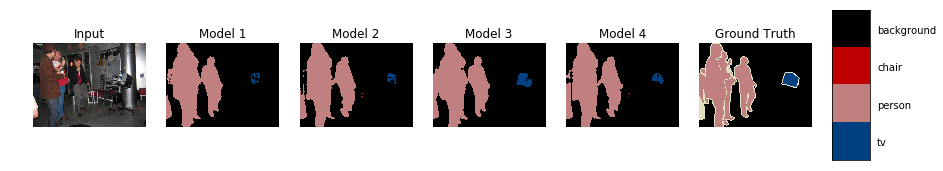

Processing sample 67 of 1449


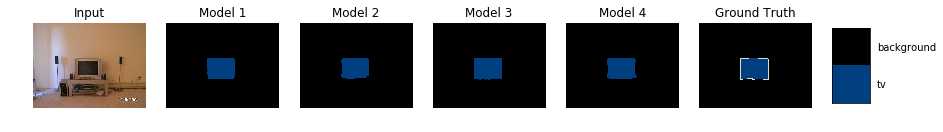

Processing sample 68 of 1449


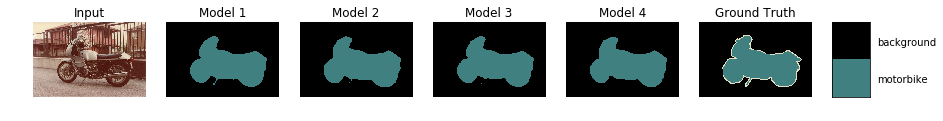

Processing sample 69 of 1449


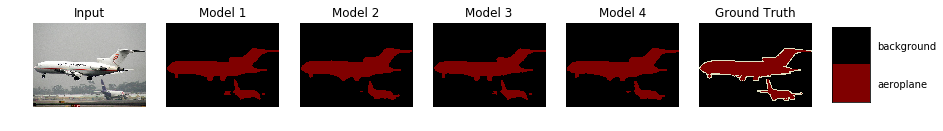

Processing sample 70 of 1449


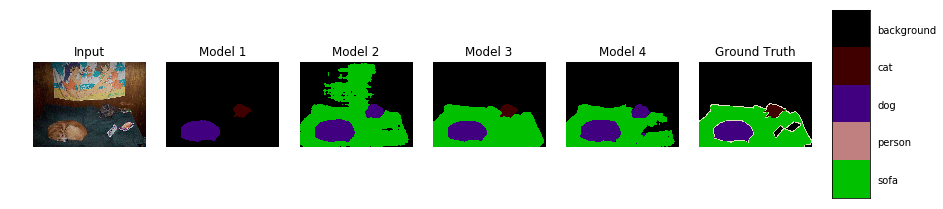

Processing sample 71 of 1449


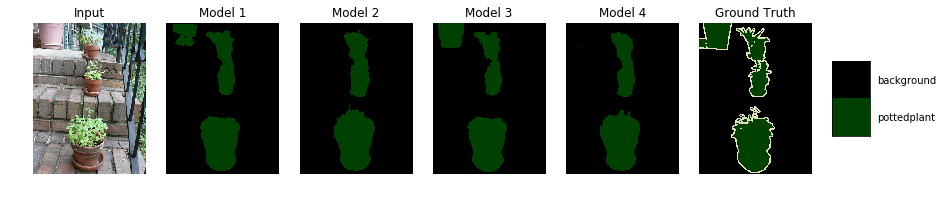

Processing sample 72 of 1449


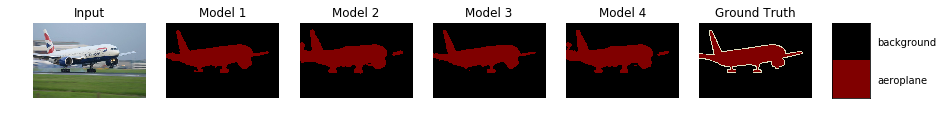

Processing sample 73 of 1449


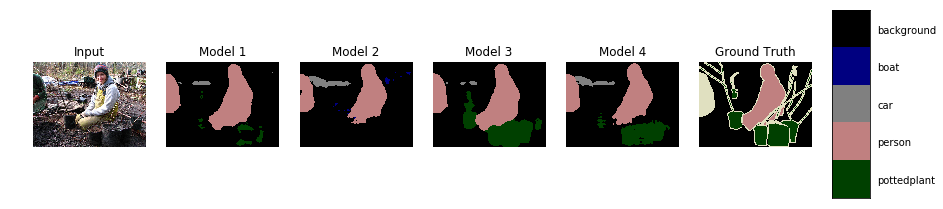

Processing sample 74 of 1449


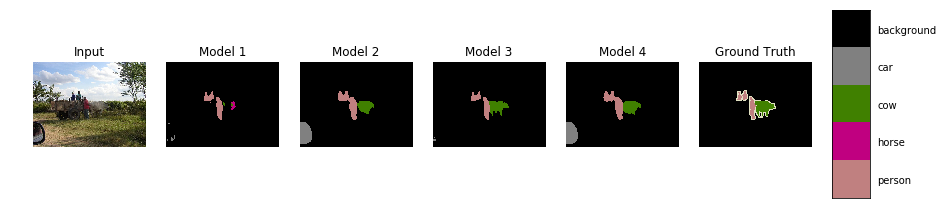

Processing sample 75 of 1449


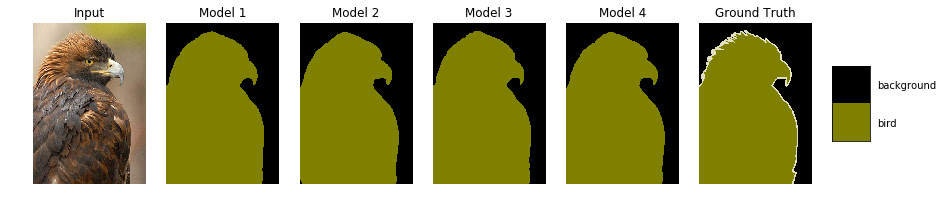

Processing sample 76 of 1449


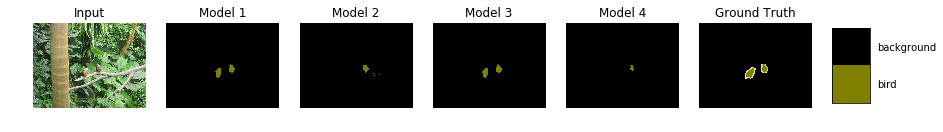

Processing sample 77 of 1449


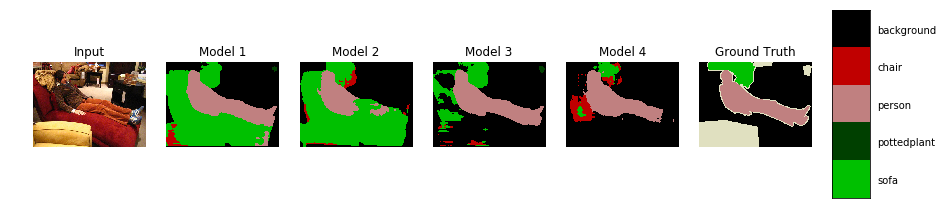

Processing sample 78 of 1449


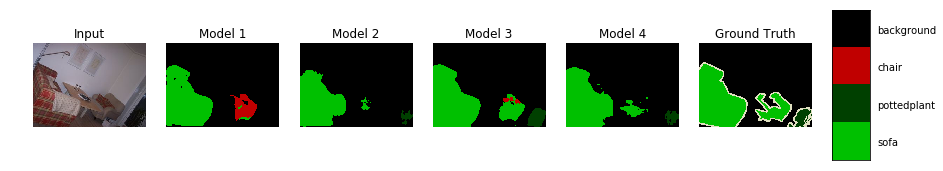

Processing sample 79 of 1449


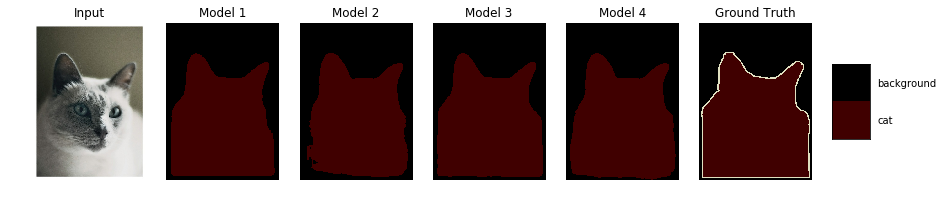

Processing sample 80 of 1449


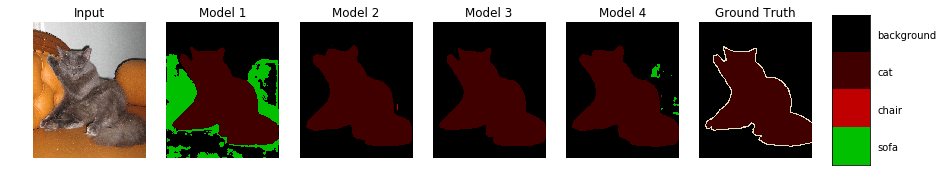

Processing sample 81 of 1449


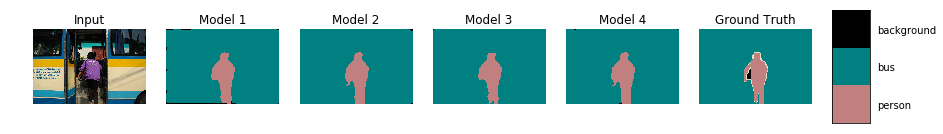

Processing sample 82 of 1449


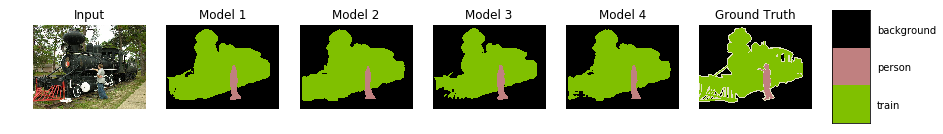

Processing sample 83 of 1449


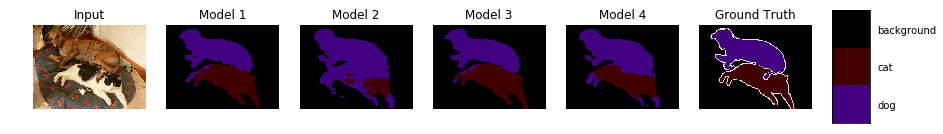

Processing sample 84 of 1449


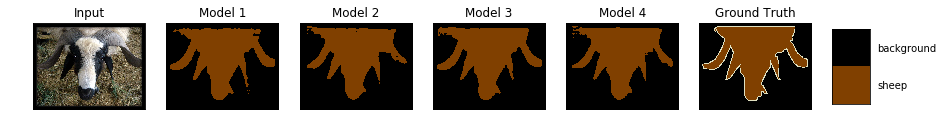

Processing sample 85 of 1449


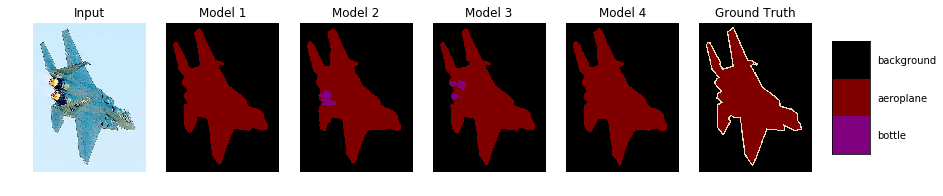

Processing sample 86 of 1449


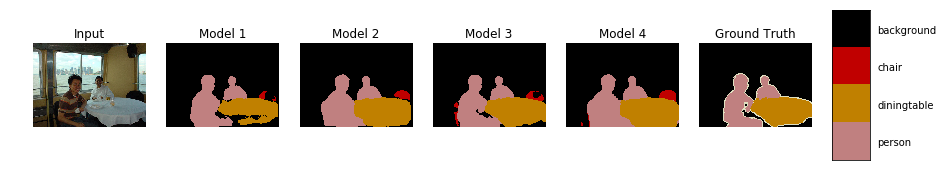

Processing sample 87 of 1449


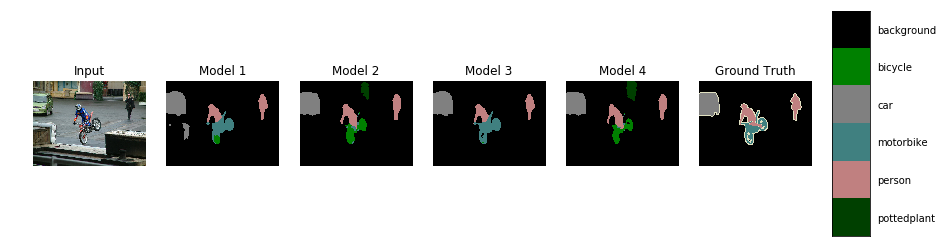

Processing sample 88 of 1449


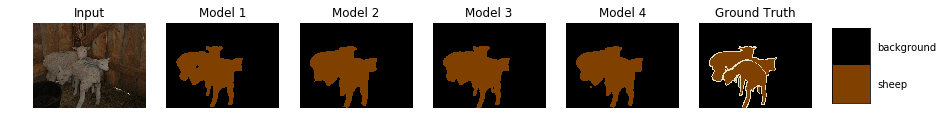

Processing sample 89 of 1449


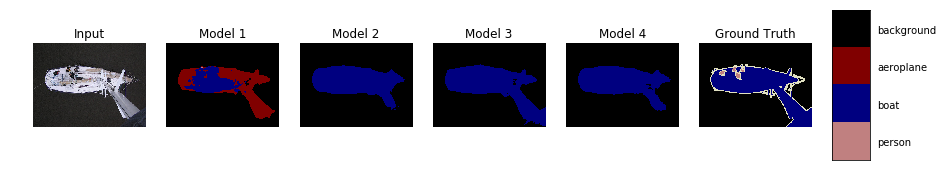

Processing sample 90 of 1449


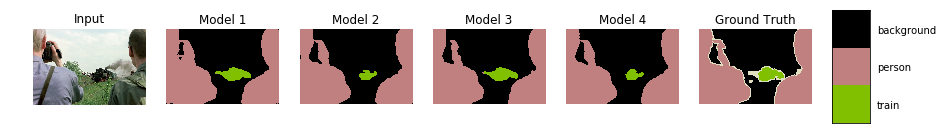

Processing sample 91 of 1449


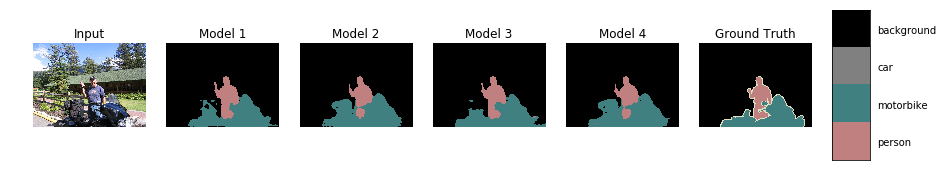

Processing sample 92 of 1449


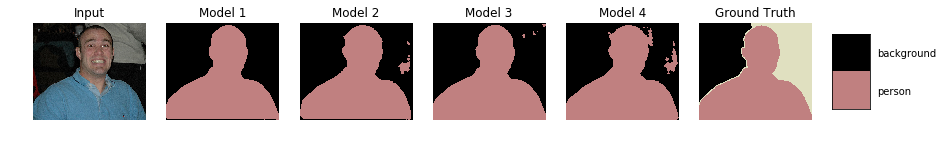

Processing sample 93 of 1449


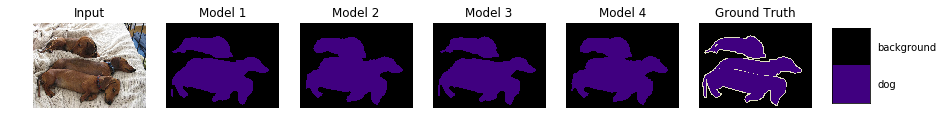

Processing sample 94 of 1449


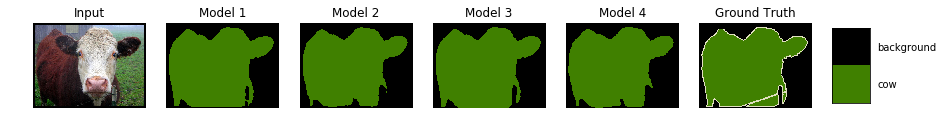

Processing sample 95 of 1449


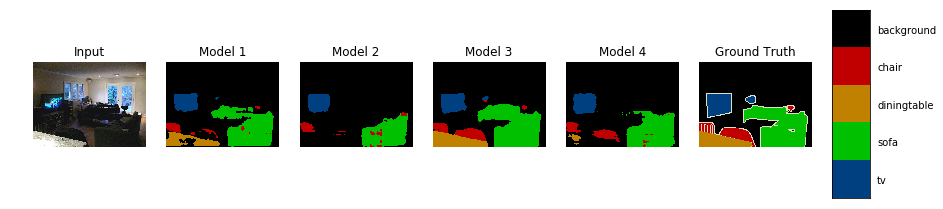

Processing sample 96 of 1449


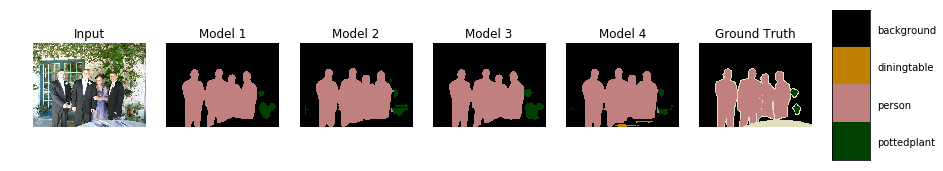

Processing sample 97 of 1449


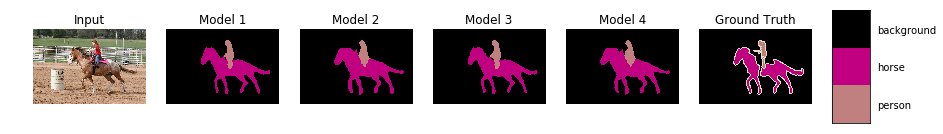

Processing sample 98 of 1449


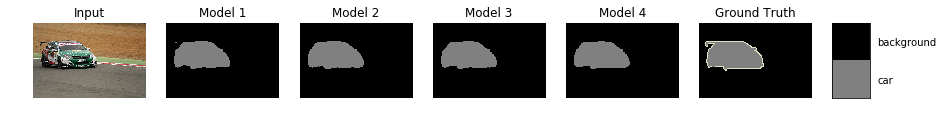

Processing sample 99 of 1449


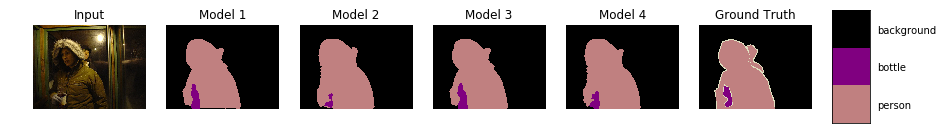

Processing sample 100 of 1449


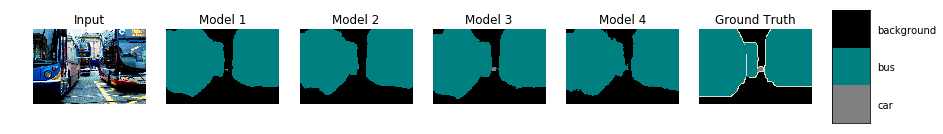

Processing sample 101 of 1449


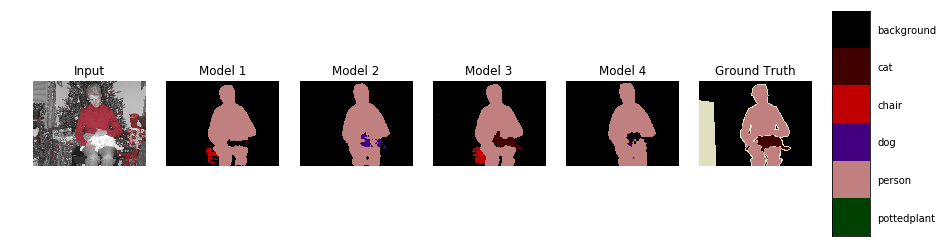

Processing sample 102 of 1449


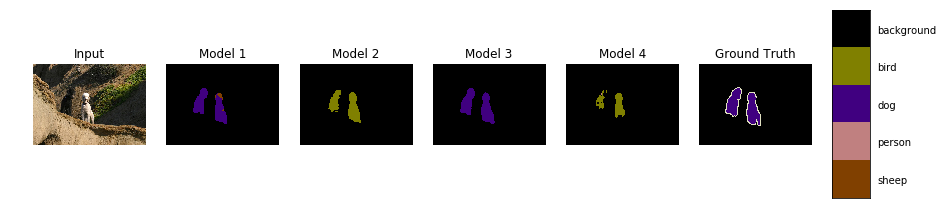

Processing sample 103 of 1449


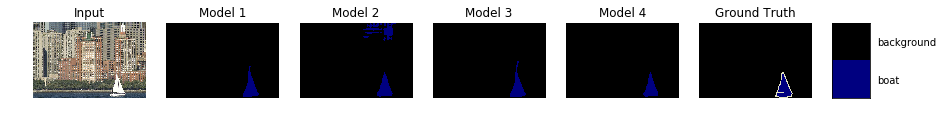

Processing sample 104 of 1449


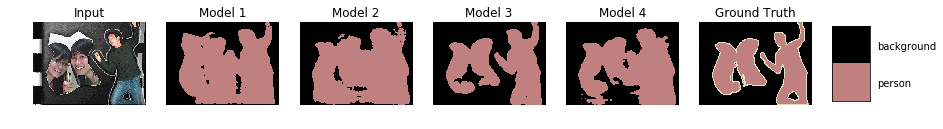

Processing sample 105 of 1449


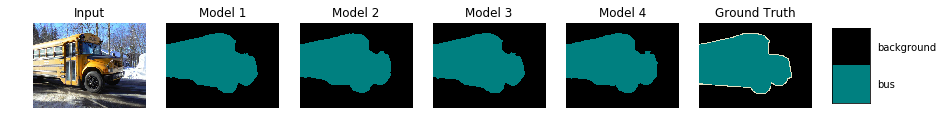

Processing sample 106 of 1449


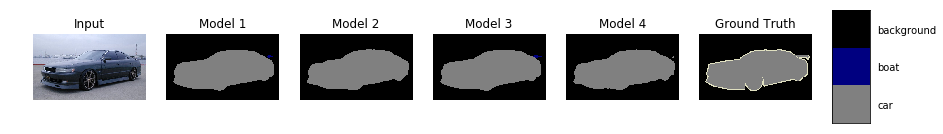

Processing sample 107 of 1449


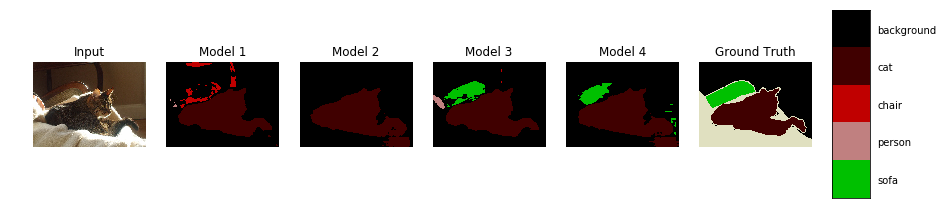

Processing sample 108 of 1449


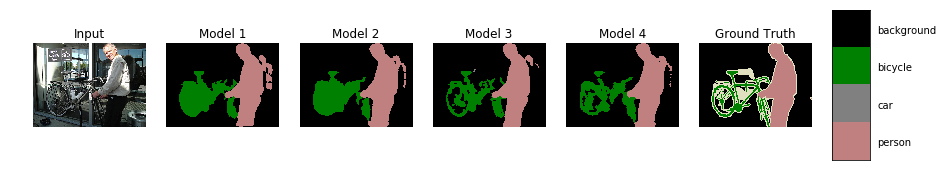

Processing sample 109 of 1449


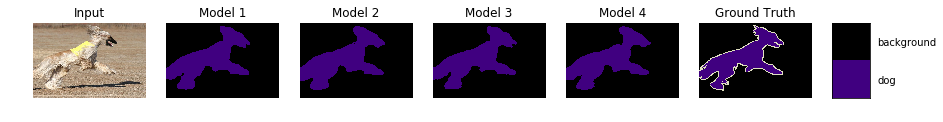

Processing sample 110 of 1449


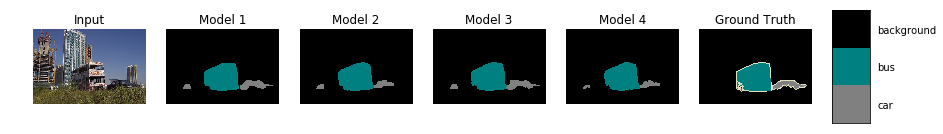

Processing sample 111 of 1449


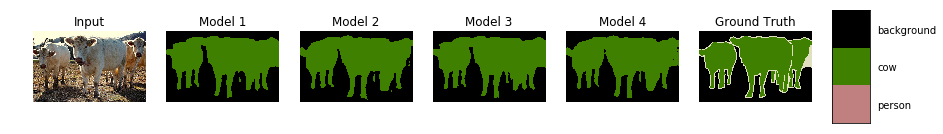

Processing sample 112 of 1449


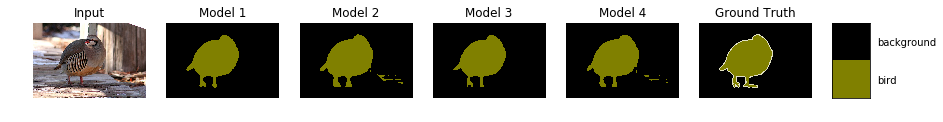

Processing sample 113 of 1449


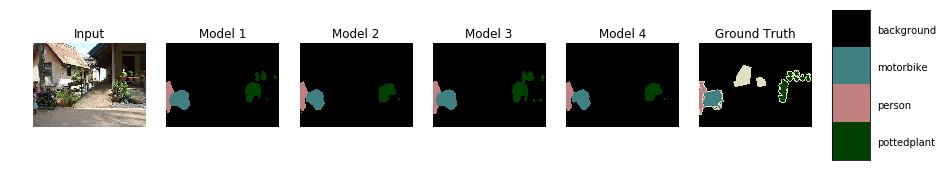

Processing sample 114 of 1449


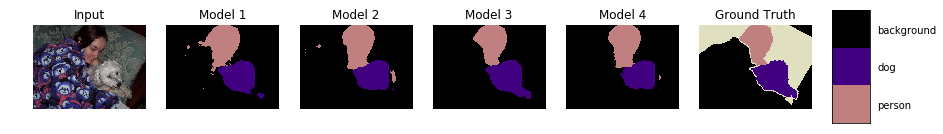

Processing sample 115 of 1449


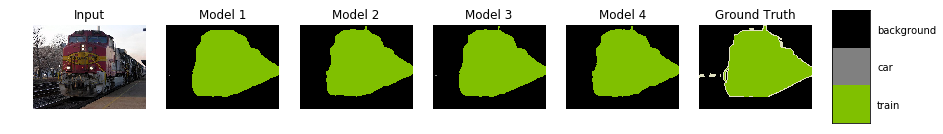

Processing sample 116 of 1449


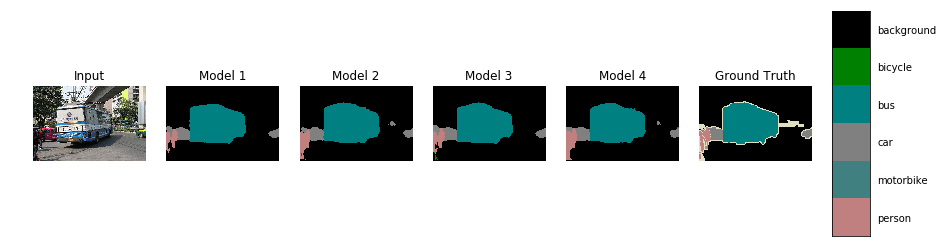

Processing sample 117 of 1449


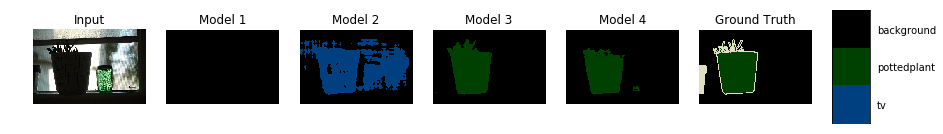

Processing sample 118 of 1449


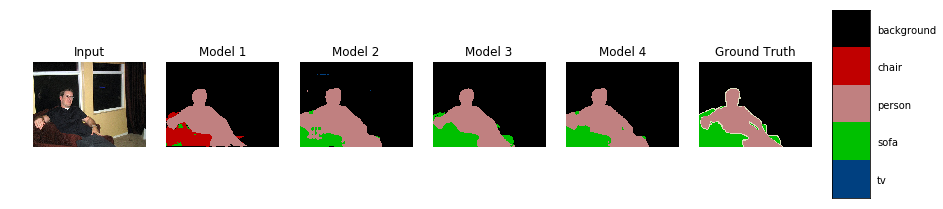

Processing sample 119 of 1449


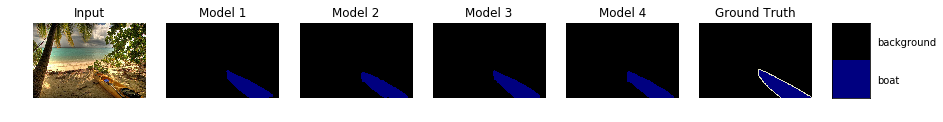

Processing sample 120 of 1449


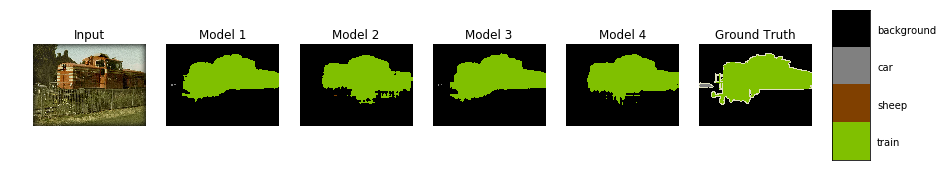

Processing sample 121 of 1449


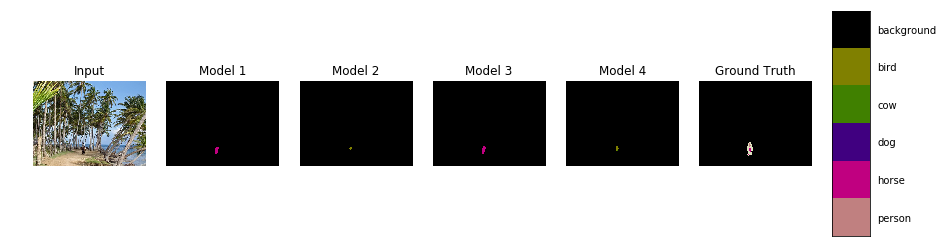

Processing sample 122 of 1449


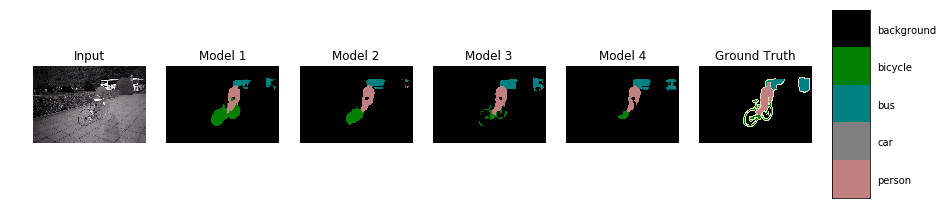

Processing sample 123 of 1449


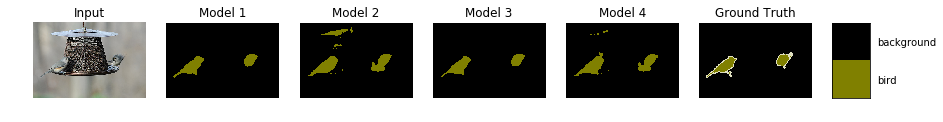

Processing sample 124 of 1449


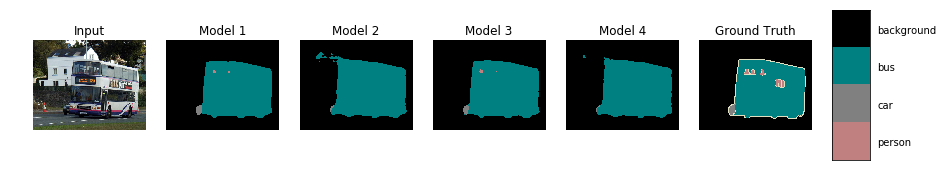

Processing sample 125 of 1449


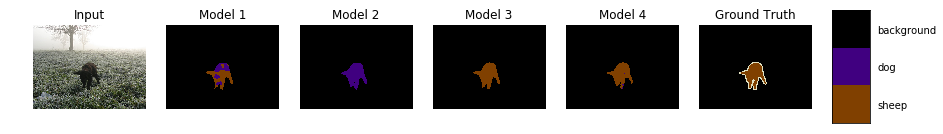

Processing sample 126 of 1449


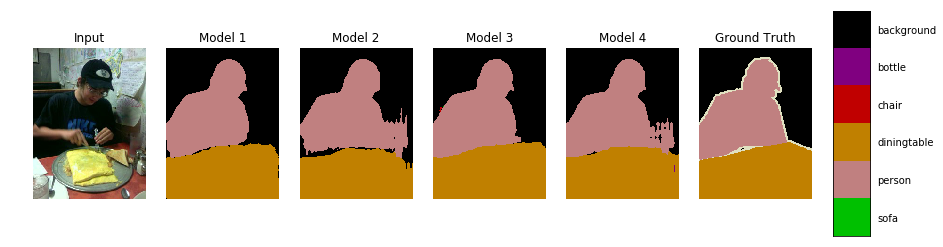

Processing sample 127 of 1449


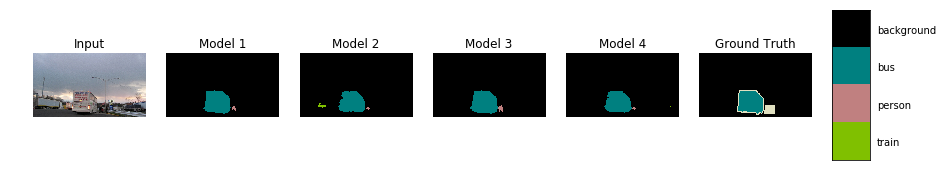

Processing sample 128 of 1449


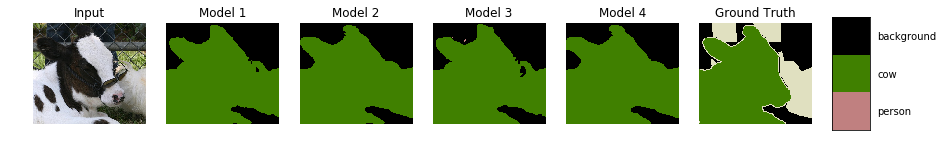

Processing sample 129 of 1449


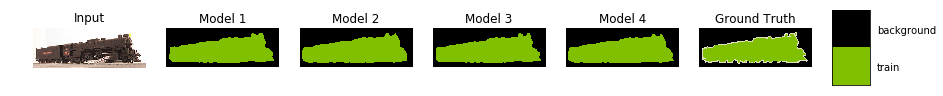

Processing sample 130 of 1449


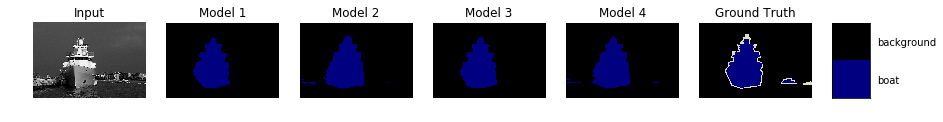

Processing sample 131 of 1449


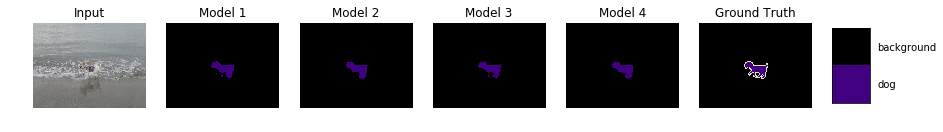

Processing sample 132 of 1449


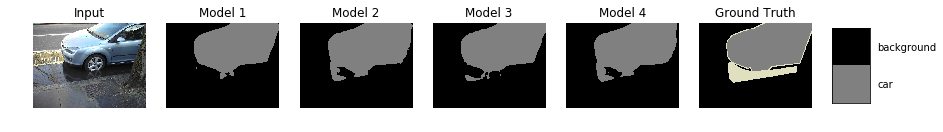

Processing sample 133 of 1449


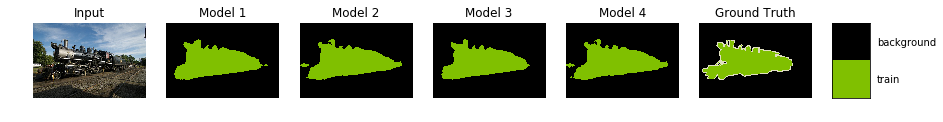

Processing sample 134 of 1449


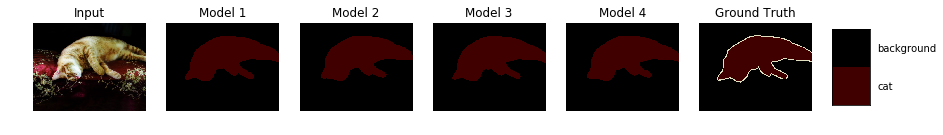

Processing sample 135 of 1449


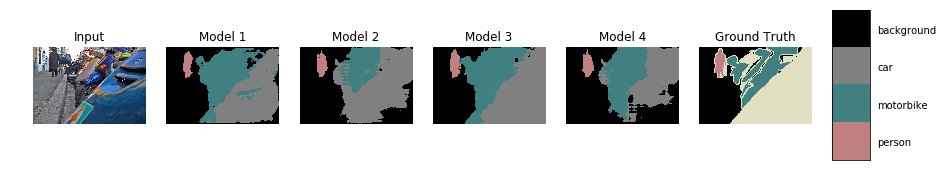

Processing sample 136 of 1449


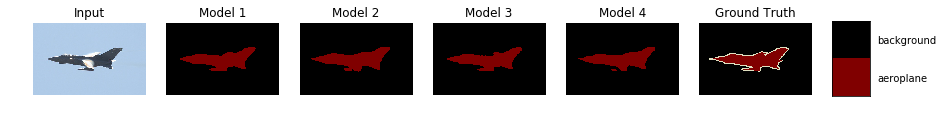

Processing sample 137 of 1449


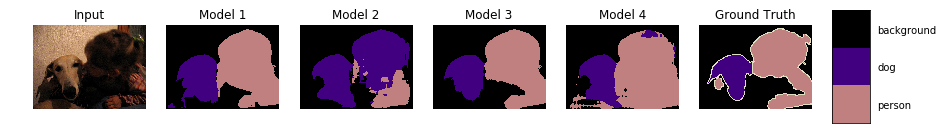

Processing sample 138 of 1449


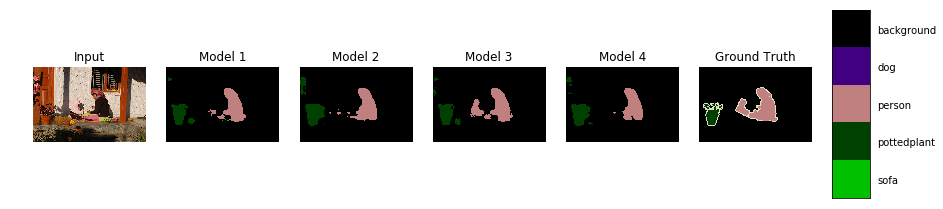

Processing sample 139 of 1449


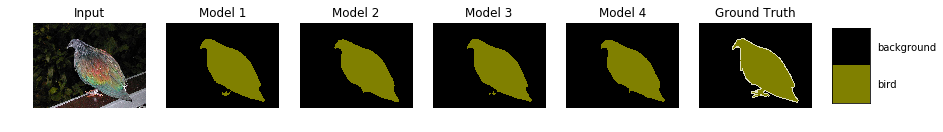

Processing sample 140 of 1449


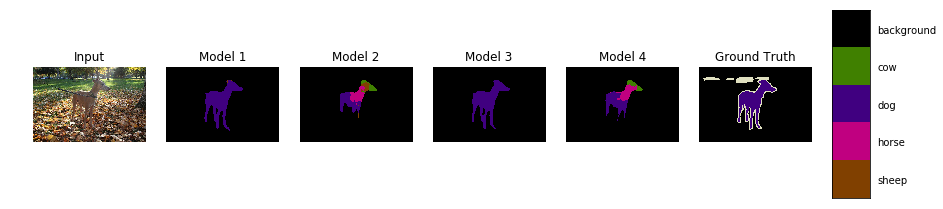

Processing sample 141 of 1449


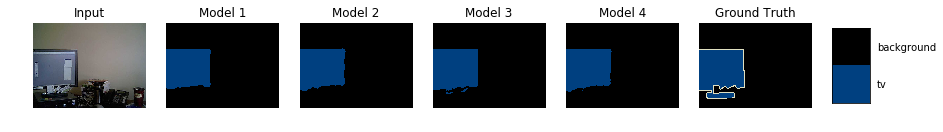

Processing sample 142 of 1449


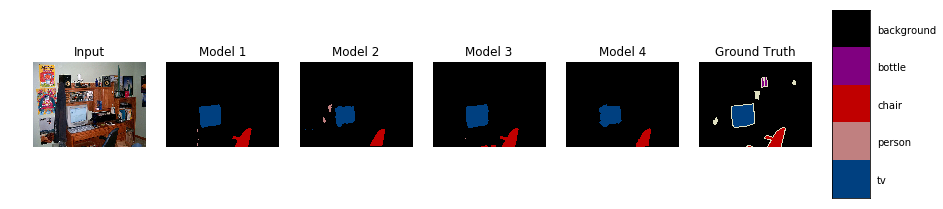

Processing sample 143 of 1449


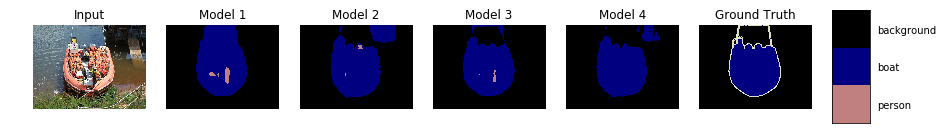

Processing sample 144 of 1449


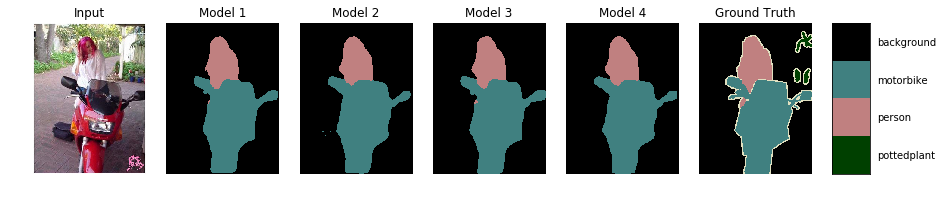

Processing sample 145 of 1449


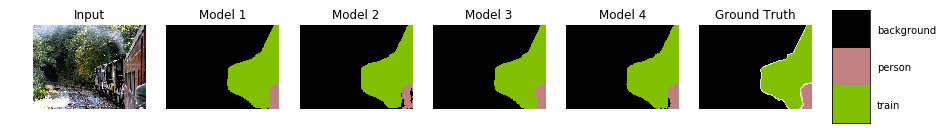

Processing sample 146 of 1449


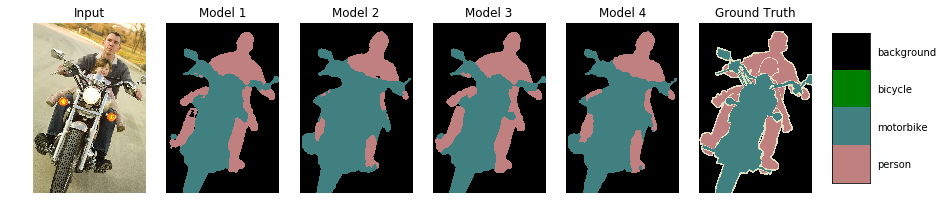

Processing sample 147 of 1449


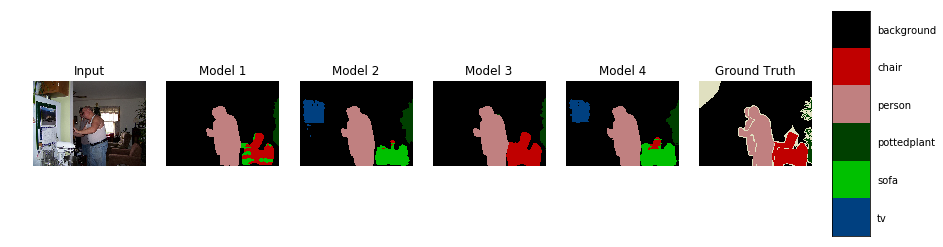

Processing sample 148 of 1449


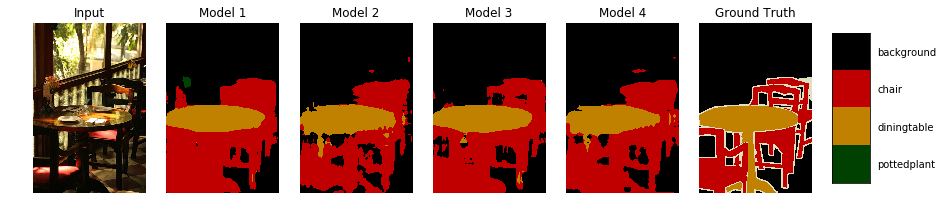

Processing sample 149 of 1449


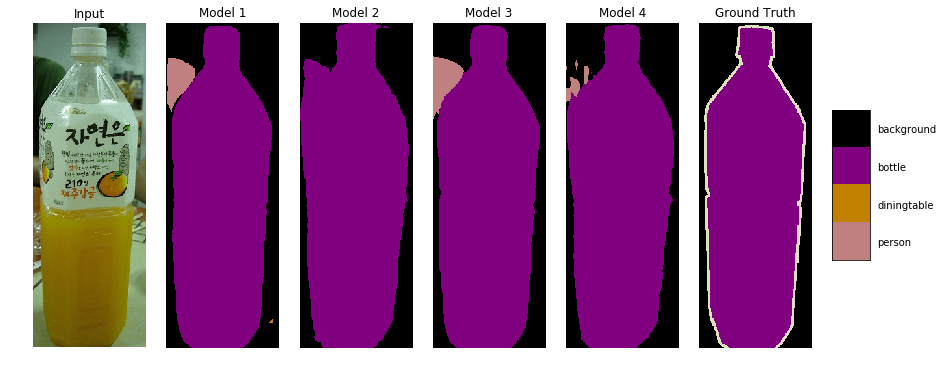

Processing sample 150 of 1449


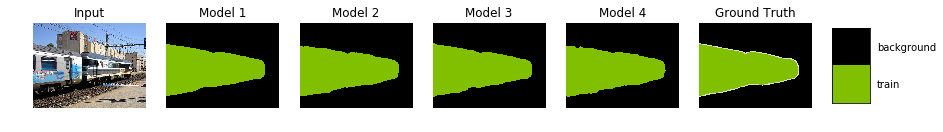

Processing sample 151 of 1449


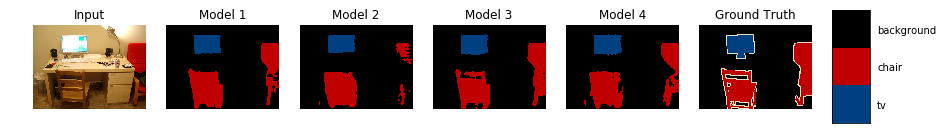

Processing sample 152 of 1449


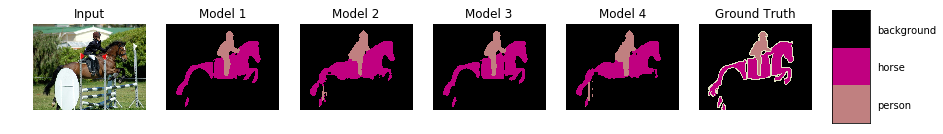

Processing sample 153 of 1449


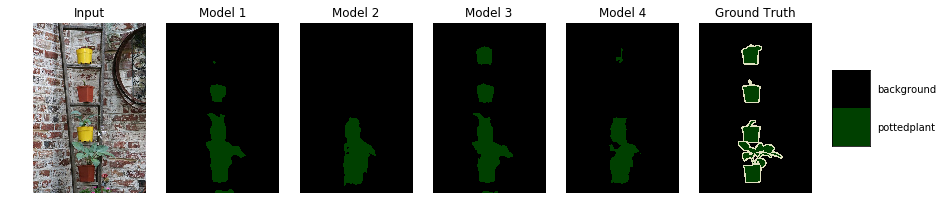

Processing sample 154 of 1449


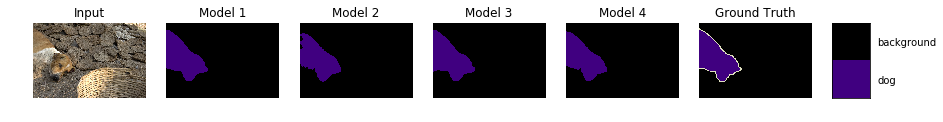

Processing sample 155 of 1449


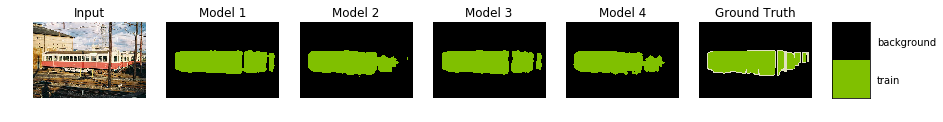

Processing sample 156 of 1449


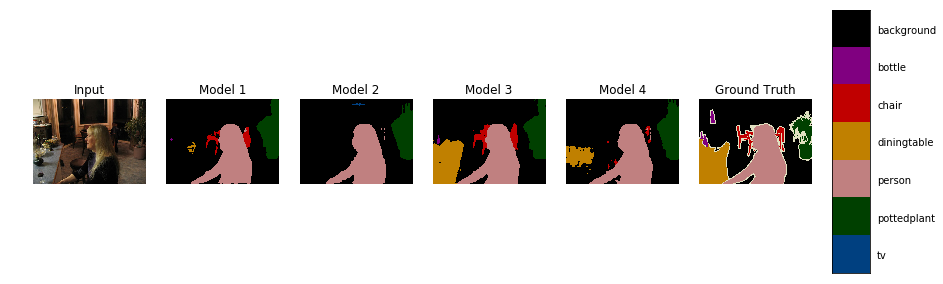

Processing sample 157 of 1449


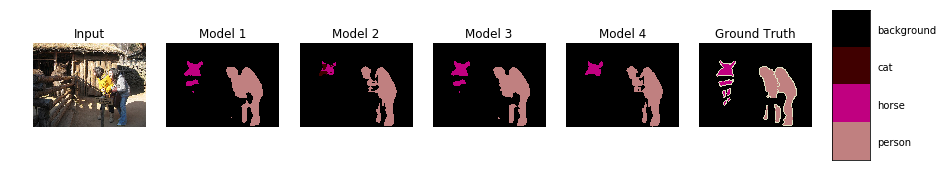

Processing sample 158 of 1449


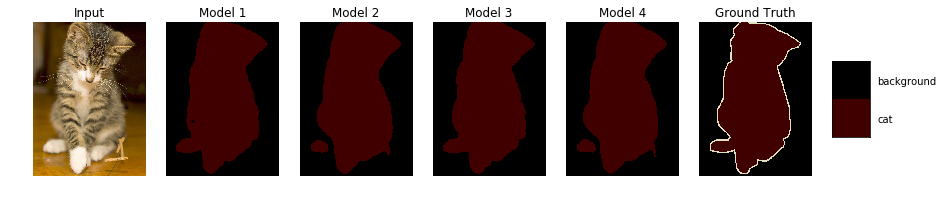

Processing sample 159 of 1449


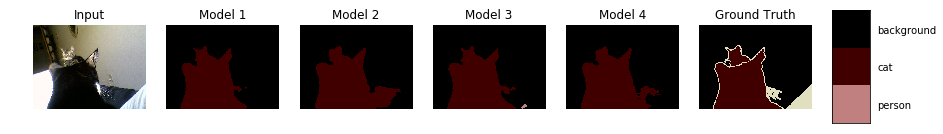

Processing sample 160 of 1449


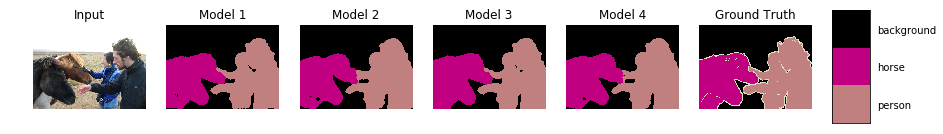

Processing sample 161 of 1449


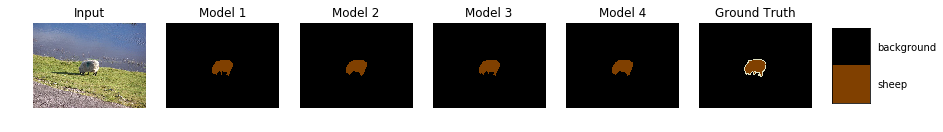

Processing sample 162 of 1449


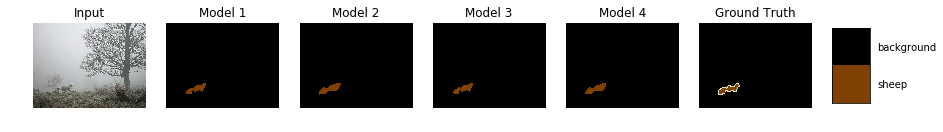

Processing sample 163 of 1449


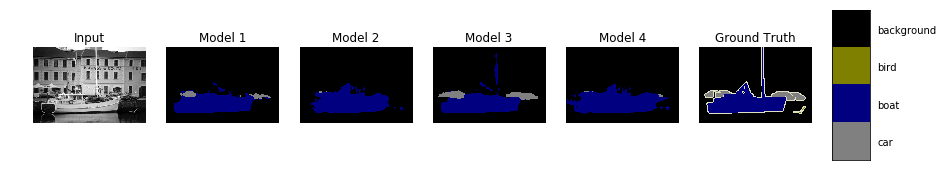

Processing sample 164 of 1449


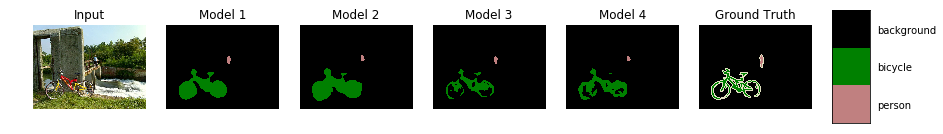

Processing sample 165 of 1449


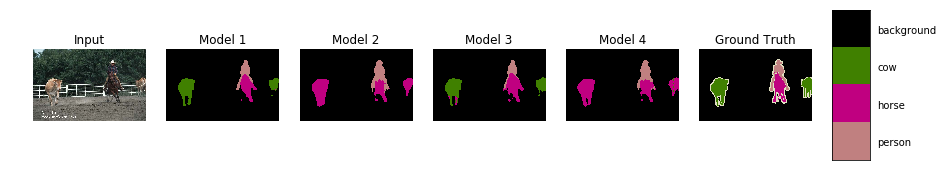

Processing sample 166 of 1449


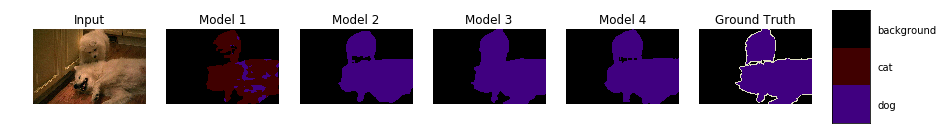

Processing sample 167 of 1449


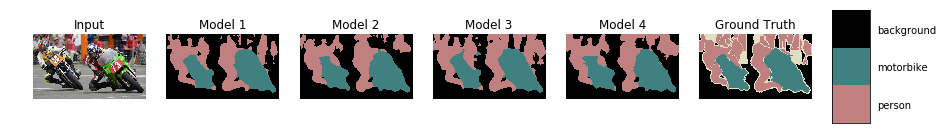

Processing sample 168 of 1449


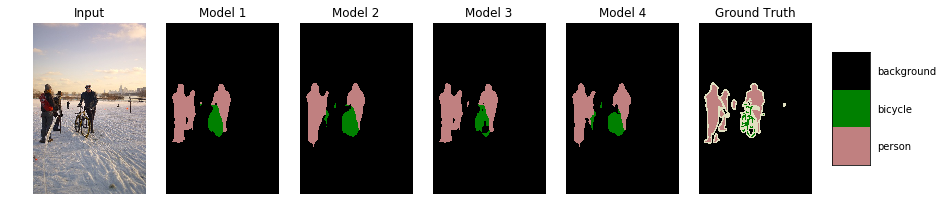

Processing sample 169 of 1449


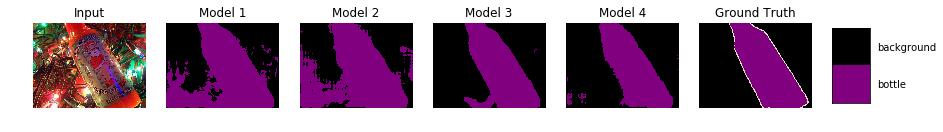

Processing sample 170 of 1449


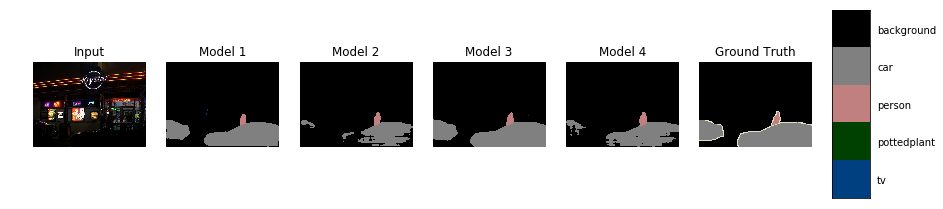

Processing sample 171 of 1449


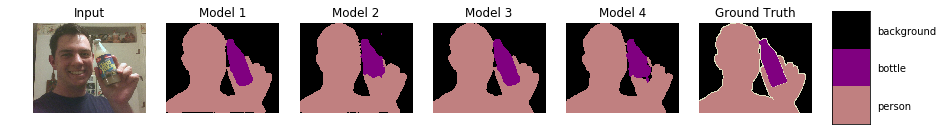

Processing sample 172 of 1449


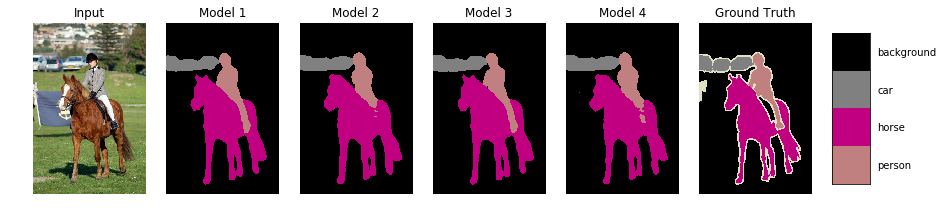

Processing sample 173 of 1449


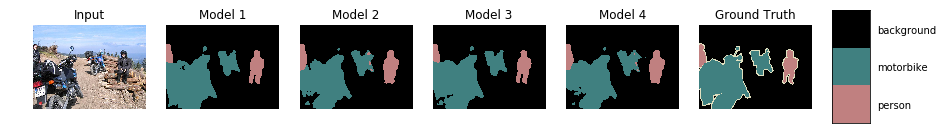

Processing sample 174 of 1449


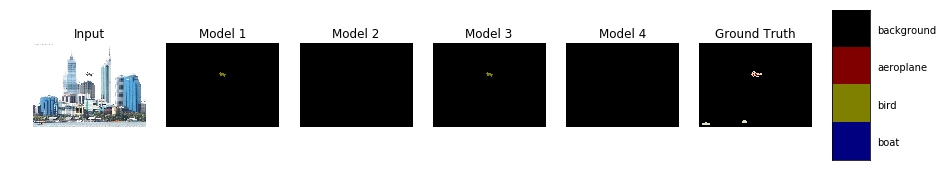

Processing sample 175 of 1449


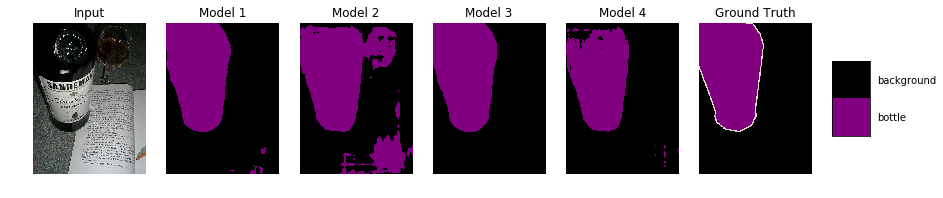

Processing sample 176 of 1449


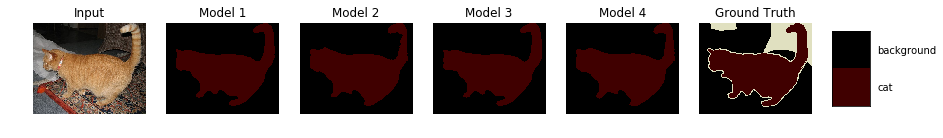

Processing sample 177 of 1449


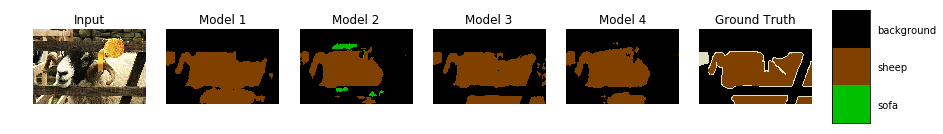

Processing sample 178 of 1449


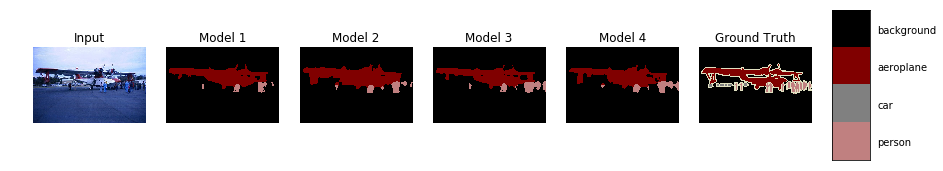

Processing sample 179 of 1449


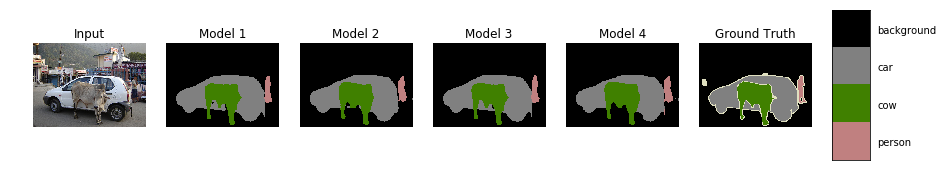

Processing sample 180 of 1449


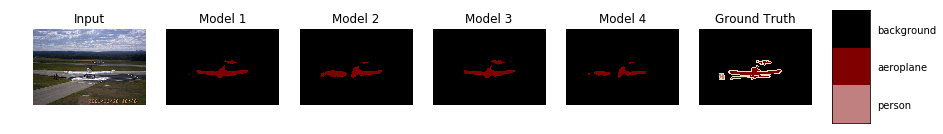

Processing sample 181 of 1449


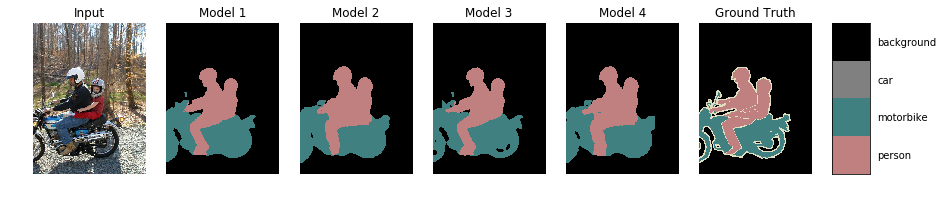

Processing sample 182 of 1449


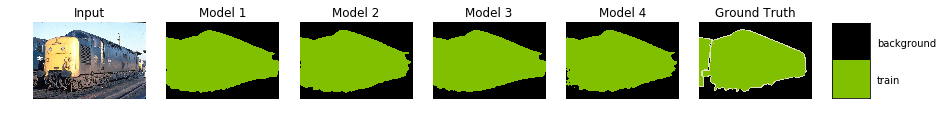

Processing sample 183 of 1449


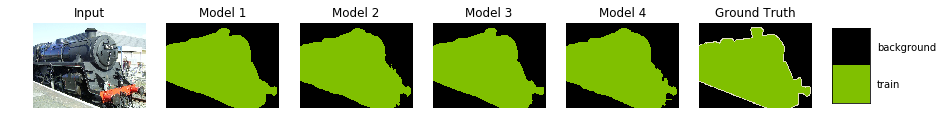

Processing sample 184 of 1449


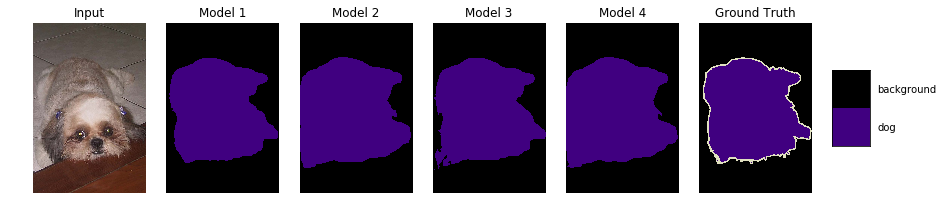

Processing sample 185 of 1449


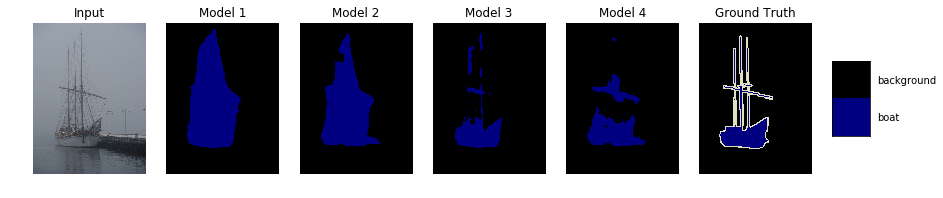

Processing sample 186 of 1449


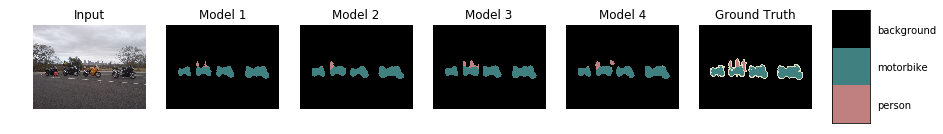

Processing sample 187 of 1449


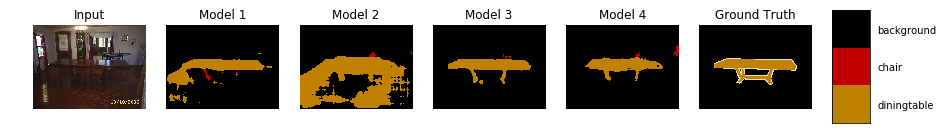

Processing sample 188 of 1449


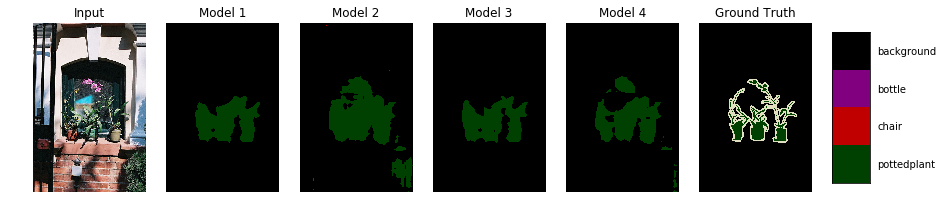

Processing sample 189 of 1449


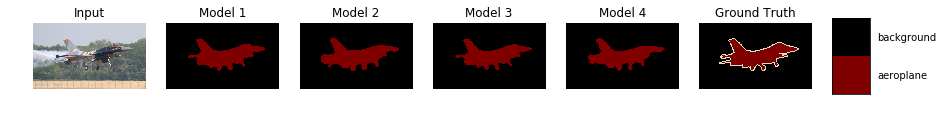

Processing sample 190 of 1449


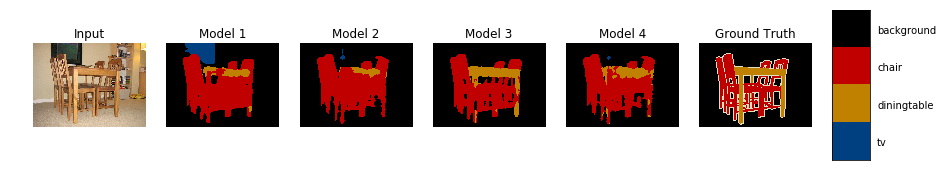

Processing sample 191 of 1449


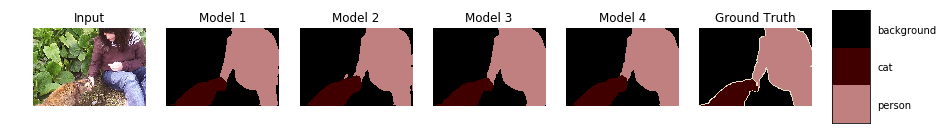

Processing sample 192 of 1449


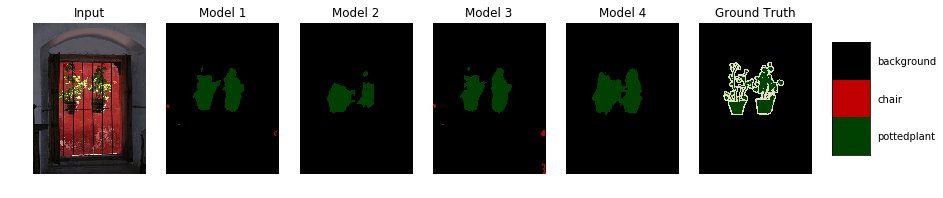

Processing sample 193 of 1449


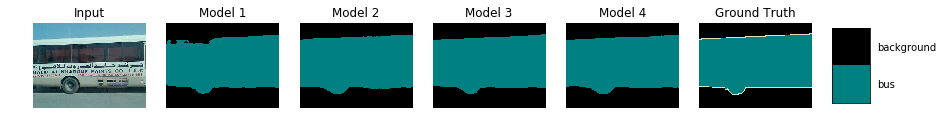

Processing sample 194 of 1449


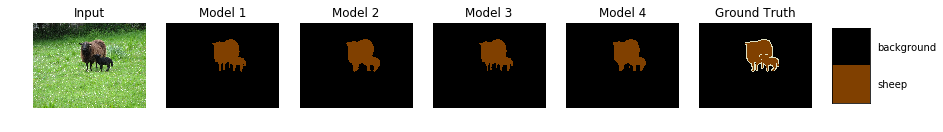

Processing sample 195 of 1449


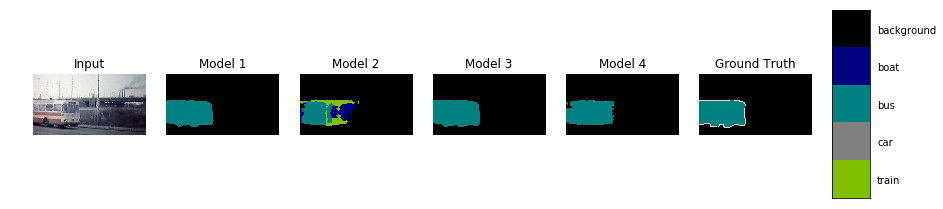

Processing sample 196 of 1449


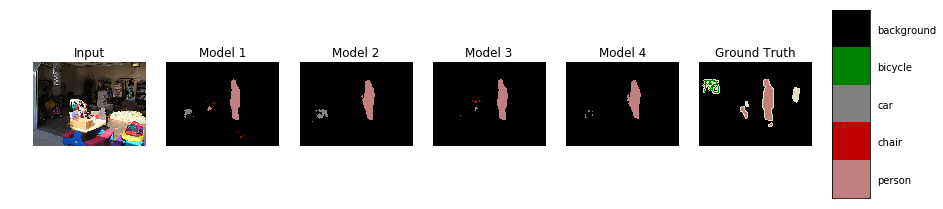

Processing sample 197 of 1449


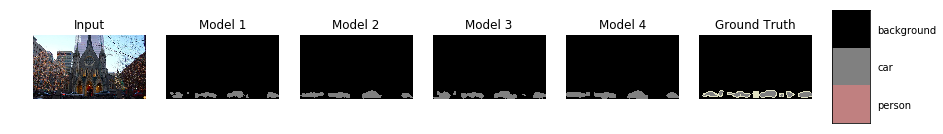

Processing sample 198 of 1449


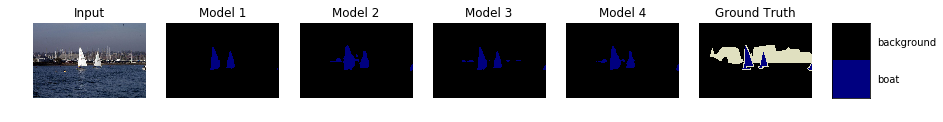

Processing sample 199 of 1449


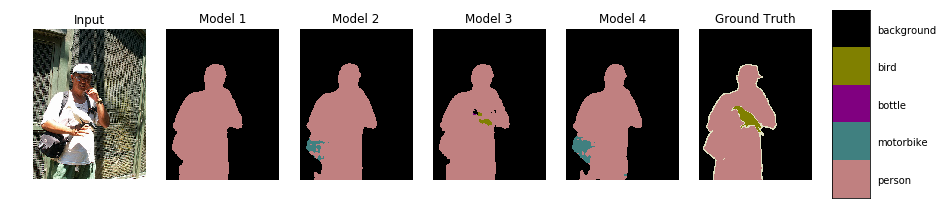

Processing sample 200 of 1449


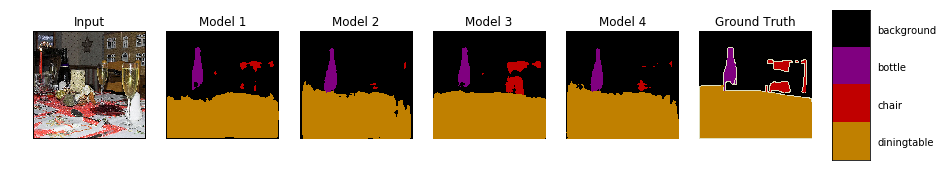

Processing sample 201 of 1449


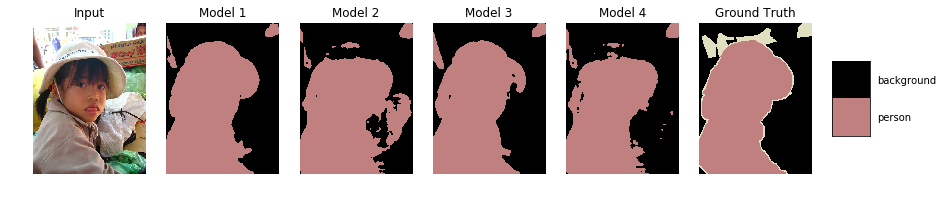

Processing sample 202 of 1449


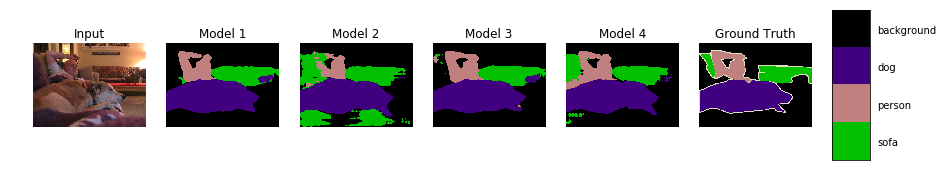

Processing sample 203 of 1449


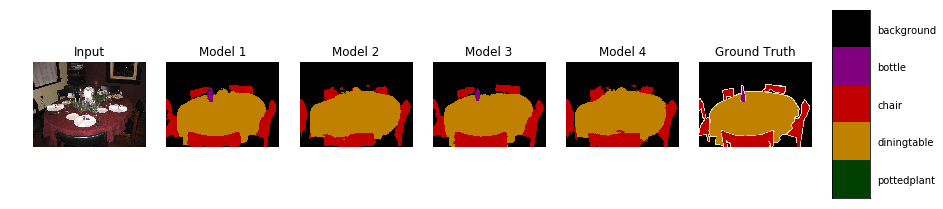

Processing sample 204 of 1449


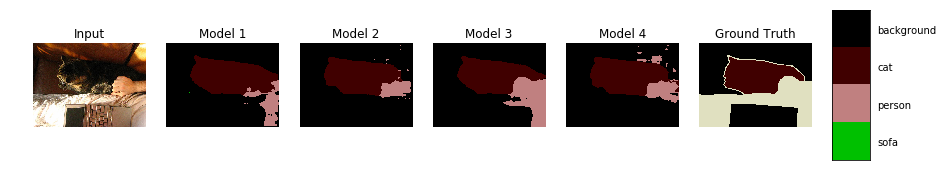

Processing sample 205 of 1449


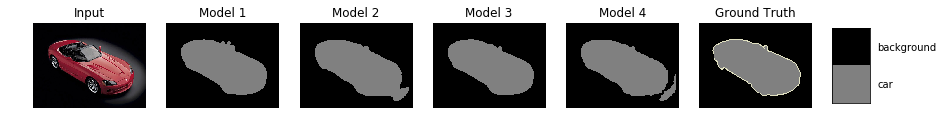

Processing sample 206 of 1449


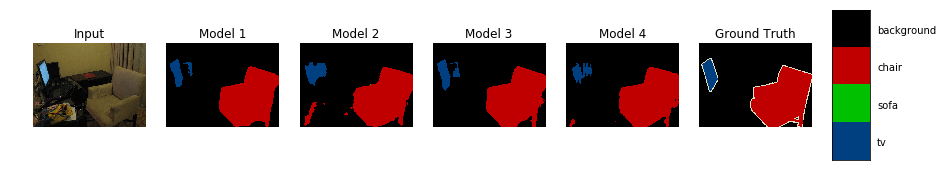

Processing sample 207 of 1449


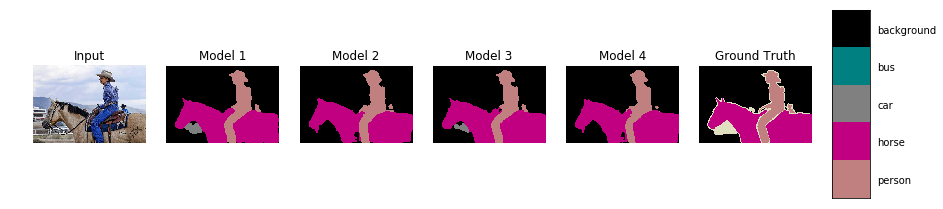

Processing sample 208 of 1449


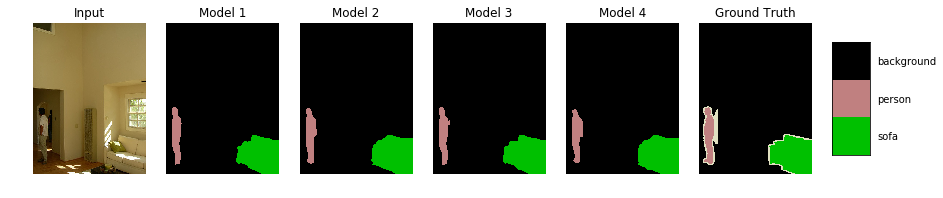

Processing sample 209 of 1449


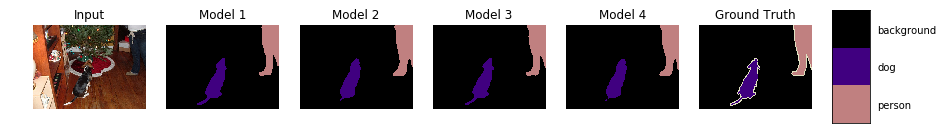

Processing sample 210 of 1449


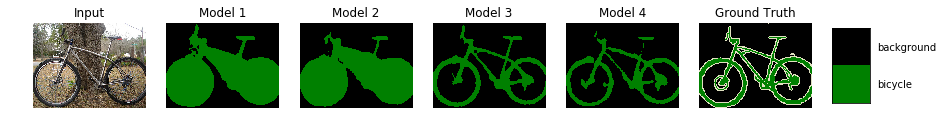

Processing sample 211 of 1449


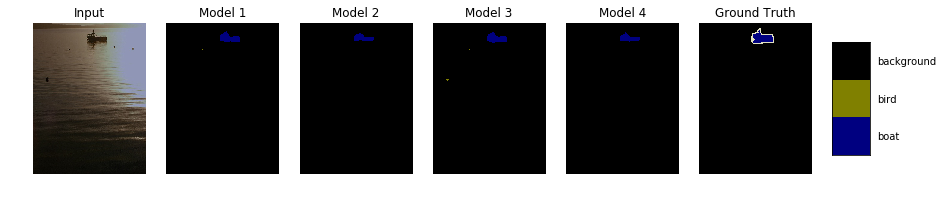

Processing sample 212 of 1449


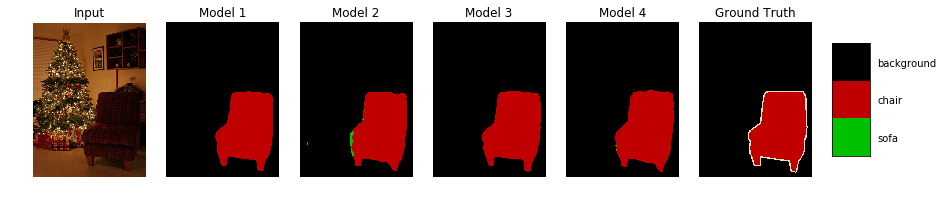

Processing sample 213 of 1449


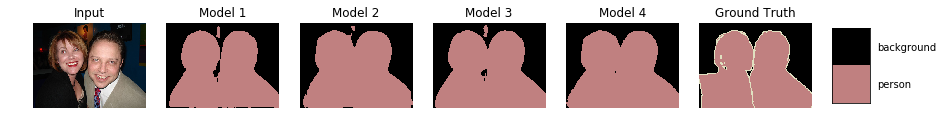

Processing sample 214 of 1449


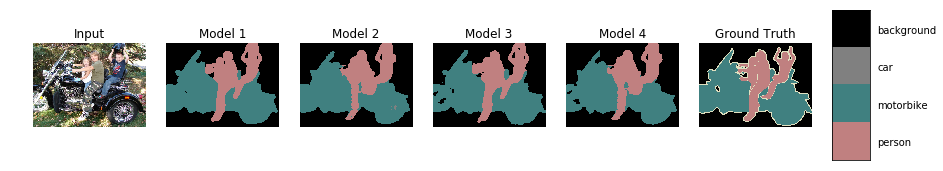

Processing sample 215 of 1449


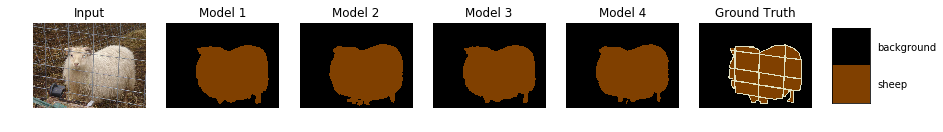

Processing sample 216 of 1449


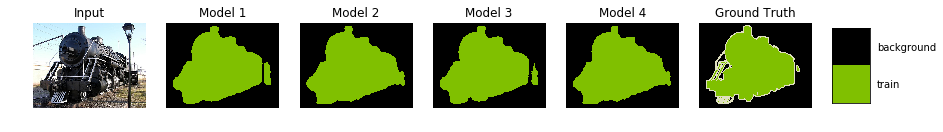

Processing sample 217 of 1449


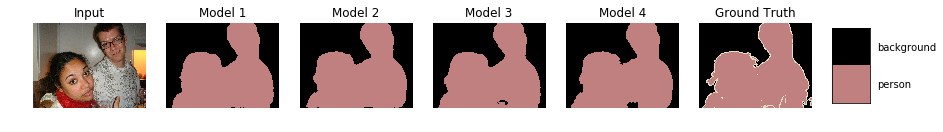

Processing sample 218 of 1449


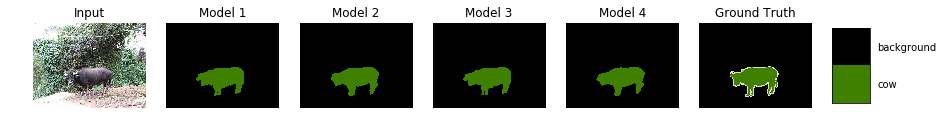

Processing sample 219 of 1449


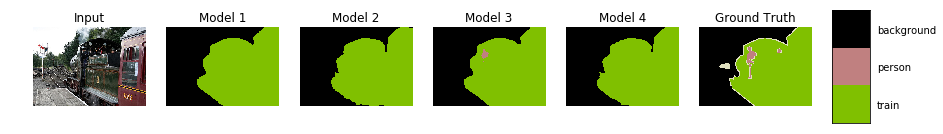

Processing sample 220 of 1449


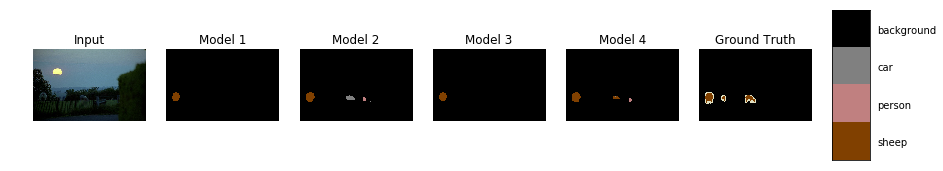

Processing sample 221 of 1449


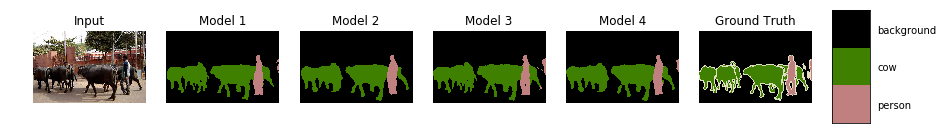

Processing sample 222 of 1449


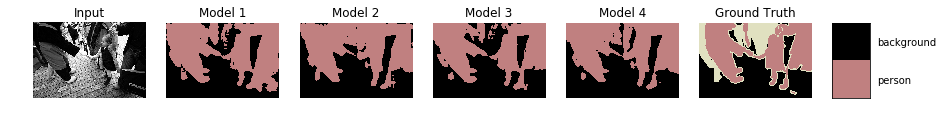

Processing sample 223 of 1449


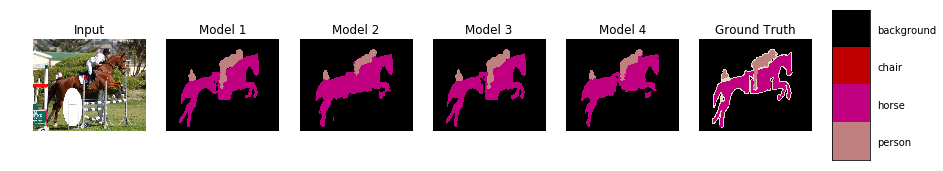

Processing sample 224 of 1449


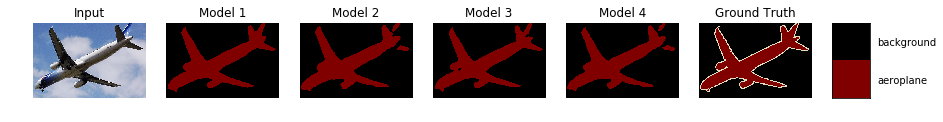

Processing sample 225 of 1449


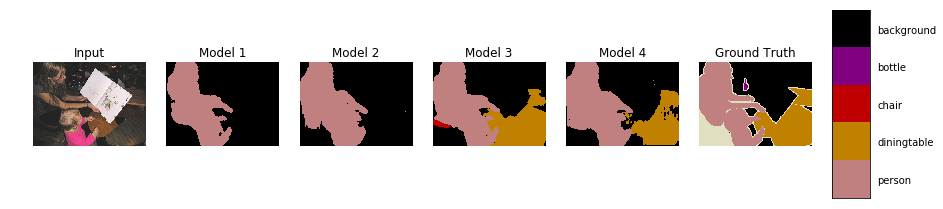

Processing sample 226 of 1449


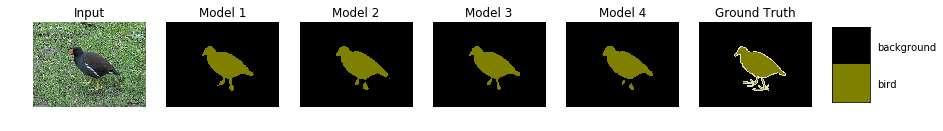

Processing sample 227 of 1449


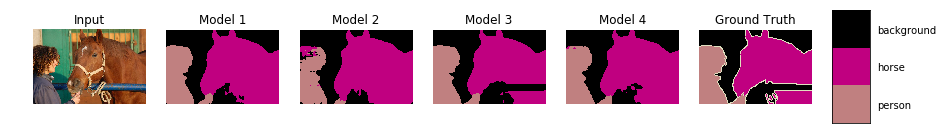

Processing sample 228 of 1449


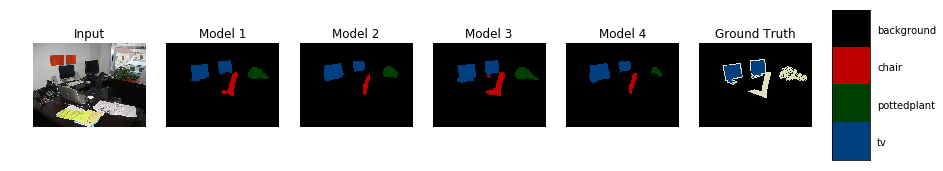

Processing sample 229 of 1449


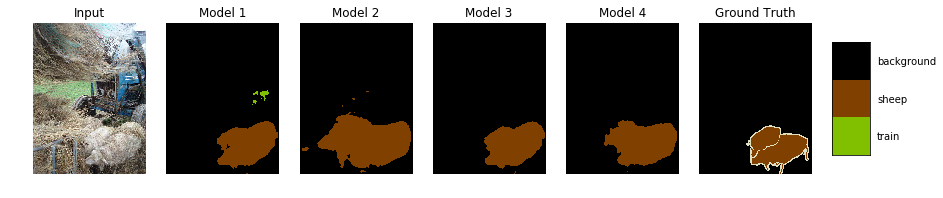

Processing sample 230 of 1449


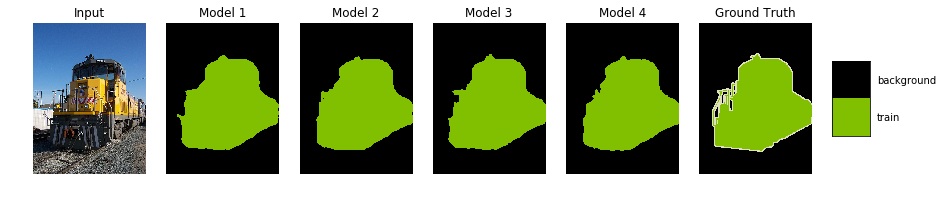

Processing sample 231 of 1449


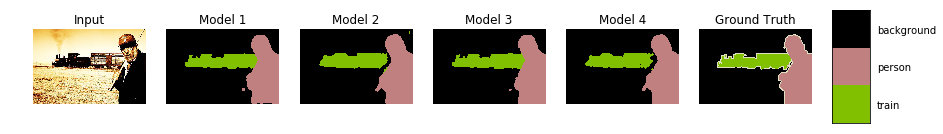

Processing sample 232 of 1449


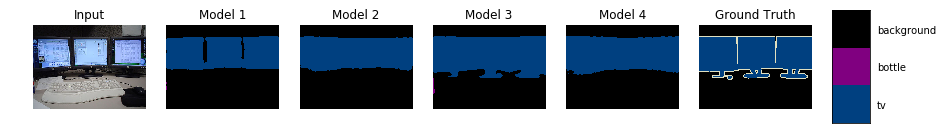

Processing sample 233 of 1449


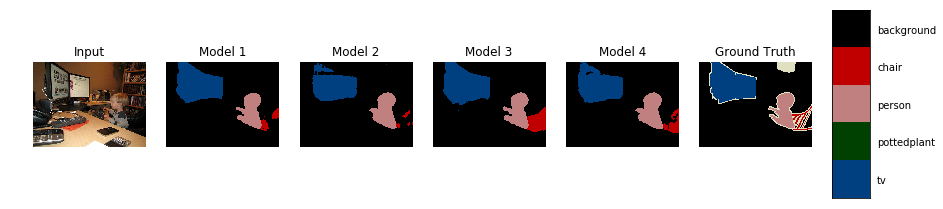

Processing sample 234 of 1449


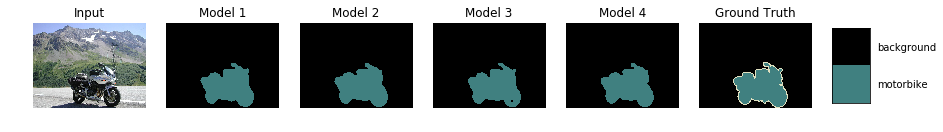

Processing sample 235 of 1449


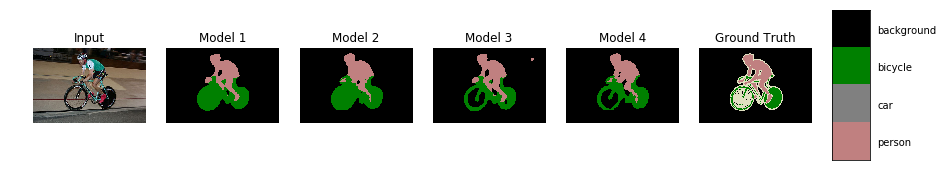

Processing sample 236 of 1449


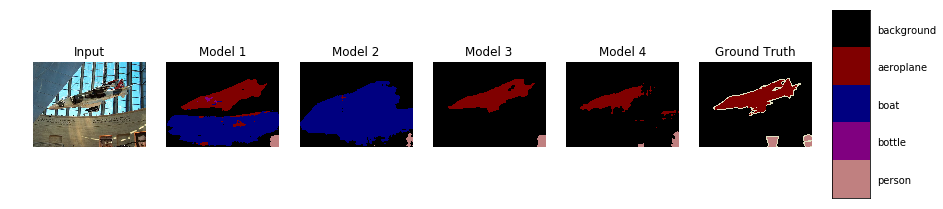

Processing sample 237 of 1449


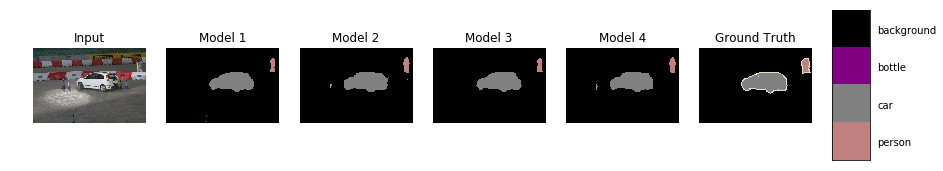

Processing sample 238 of 1449


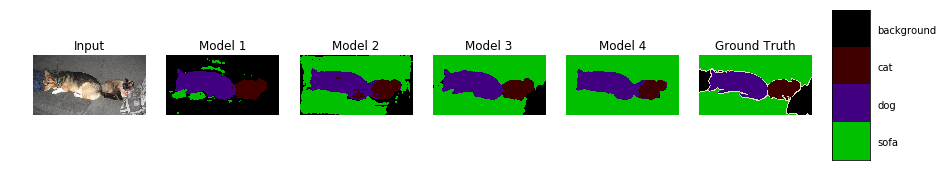

Processing sample 239 of 1449


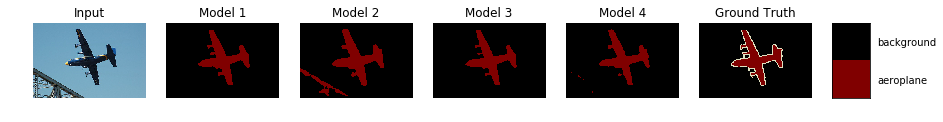

Processing sample 240 of 1449


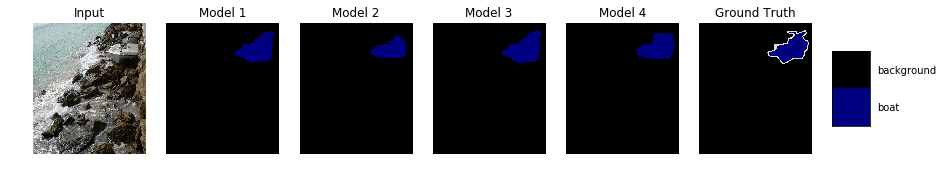

Processing sample 241 of 1449


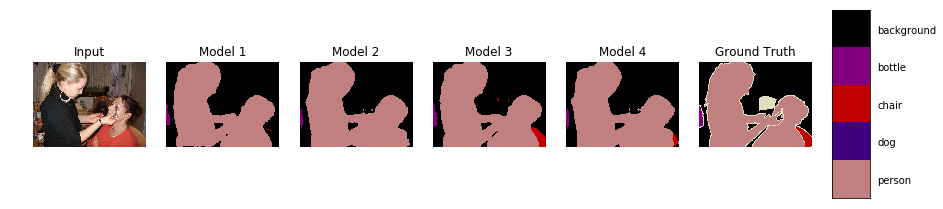

Processing sample 242 of 1449


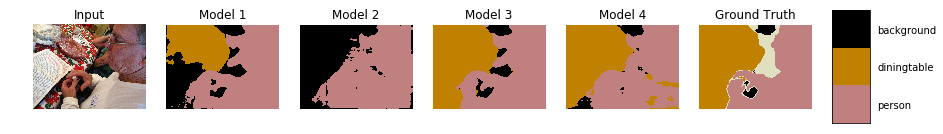

Processing sample 243 of 1449


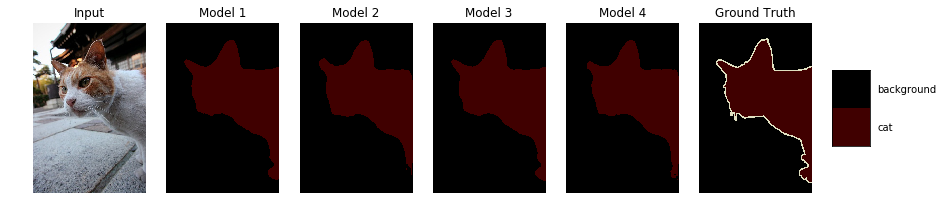

Processing sample 244 of 1449


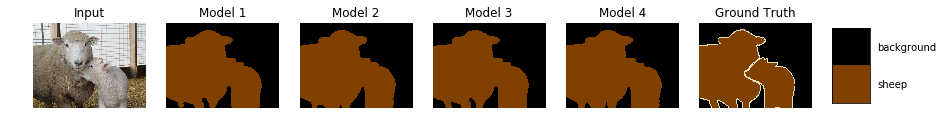

Processing sample 245 of 1449


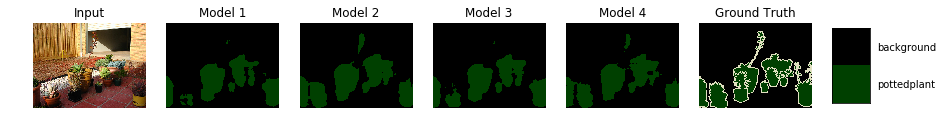

Processing sample 246 of 1449


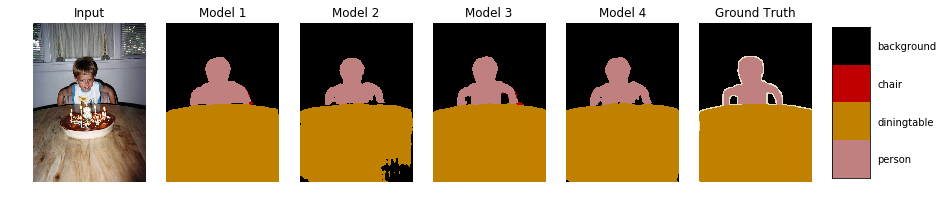

Processing sample 247 of 1449


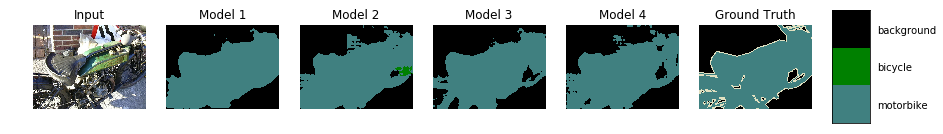

Processing sample 248 of 1449


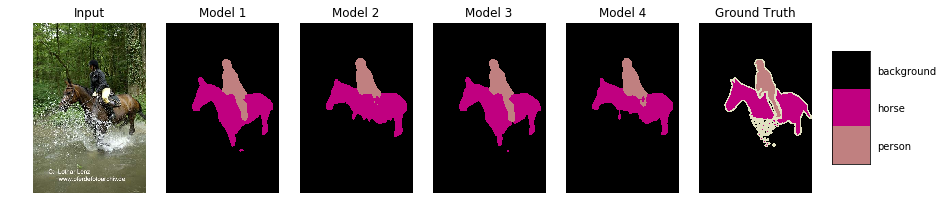

Processing sample 249 of 1449


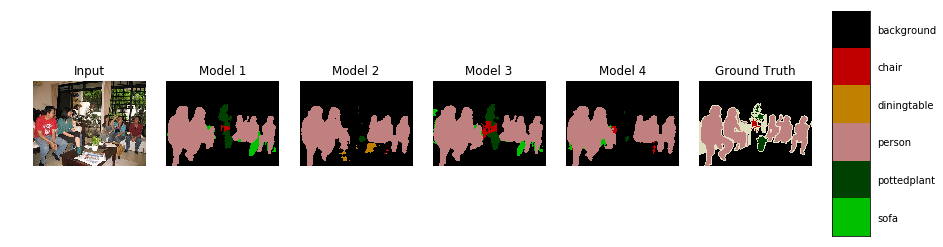

Processing sample 250 of 1449


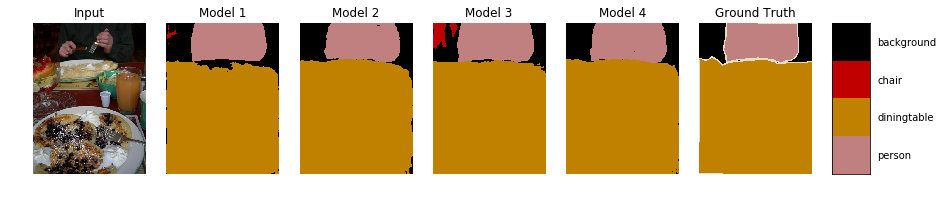

Processing sample 251 of 1449


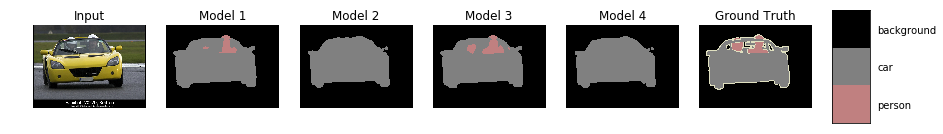

Processing sample 252 of 1449


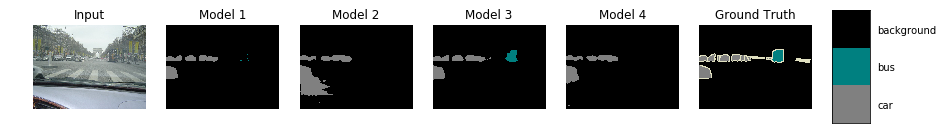

Processing sample 253 of 1449


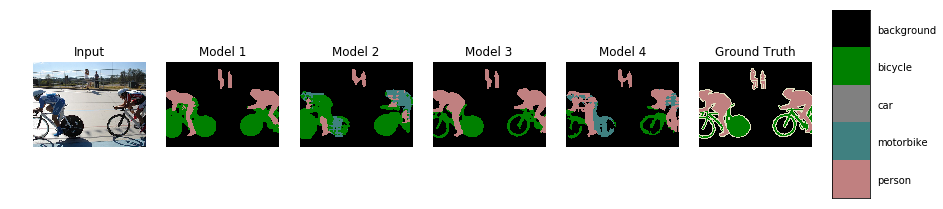

Processing sample 254 of 1449


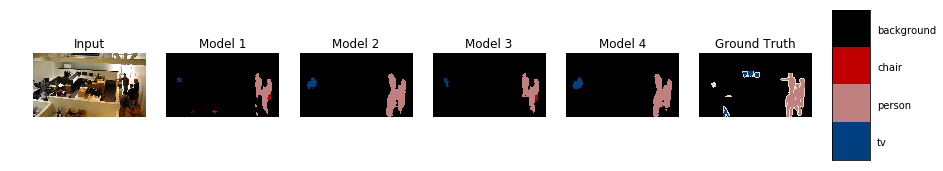

Processing sample 255 of 1449


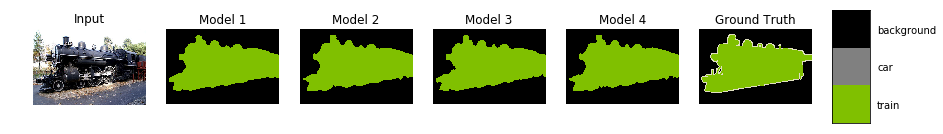

Processing sample 256 of 1449


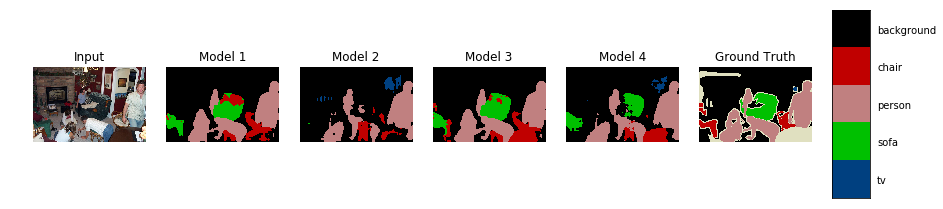

Processing sample 257 of 1449


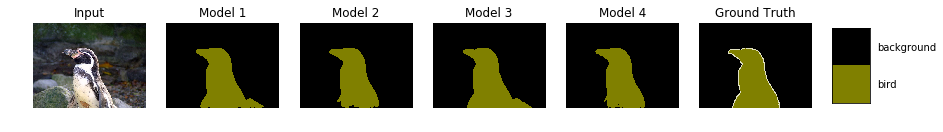

Processing sample 258 of 1449


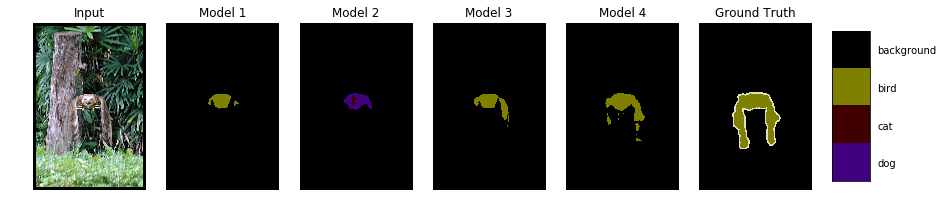

Processing sample 259 of 1449


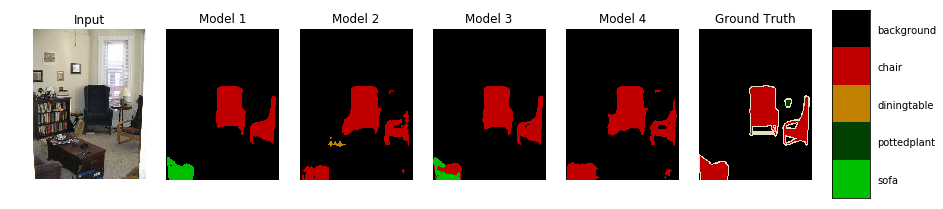

Processing sample 260 of 1449


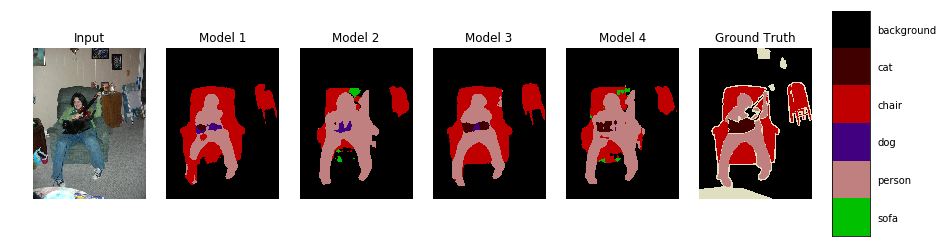

Processing sample 261 of 1449


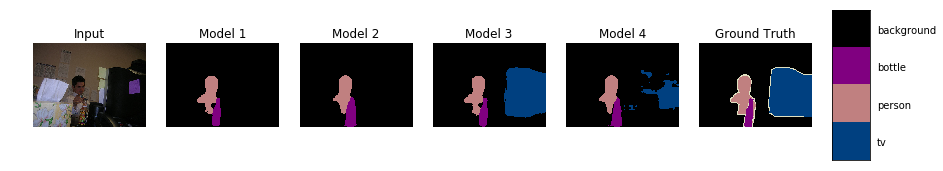

Processing sample 262 of 1449


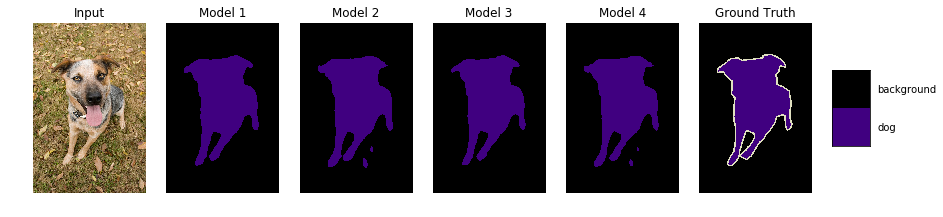

Processing sample 263 of 1449


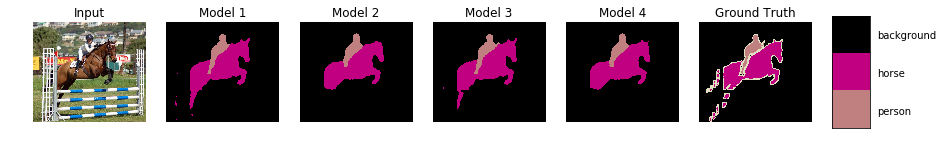

Processing sample 264 of 1449


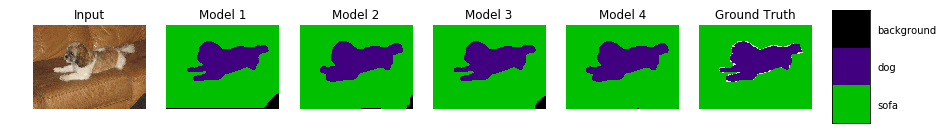

Processing sample 265 of 1449


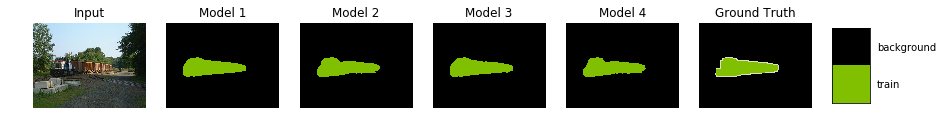

Processing sample 266 of 1449


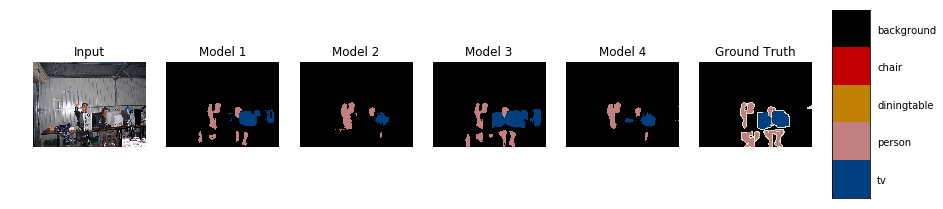

Processing sample 267 of 1449


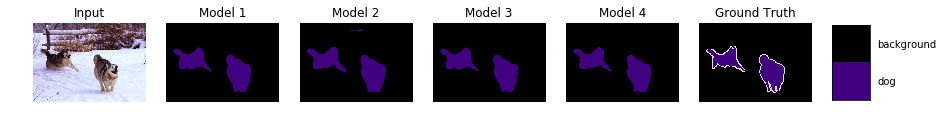

Processing sample 268 of 1449


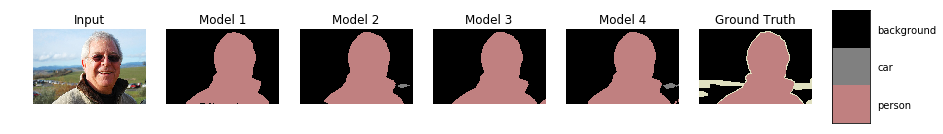

Processing sample 269 of 1449


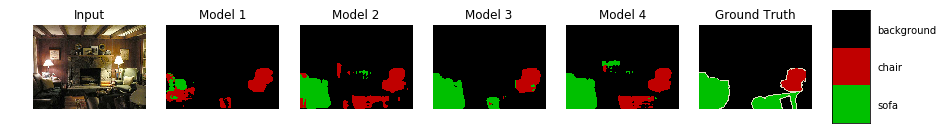

Processing sample 270 of 1449


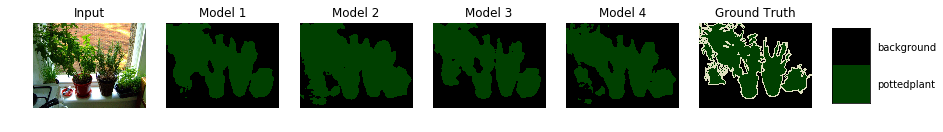

Processing sample 271 of 1449


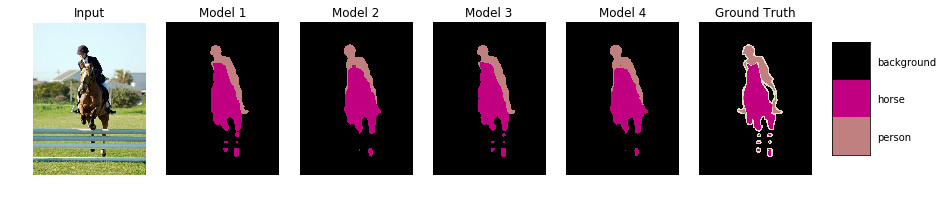

Processing sample 272 of 1449


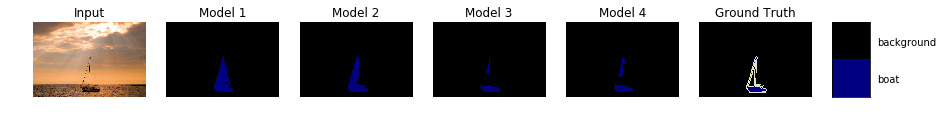

Processing sample 273 of 1449


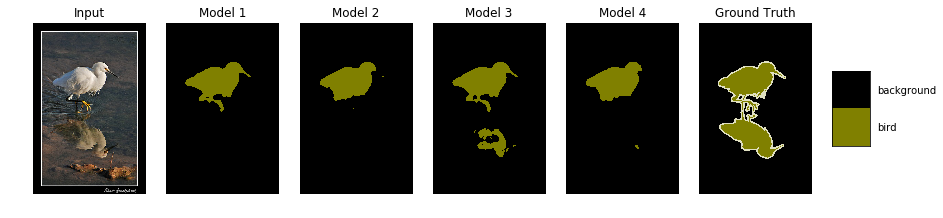

Processing sample 274 of 1449


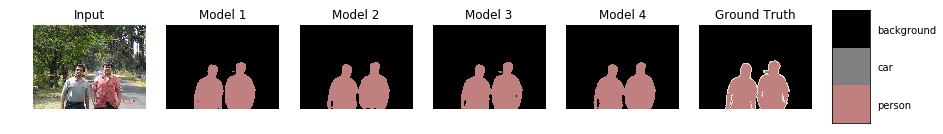

Processing sample 275 of 1449


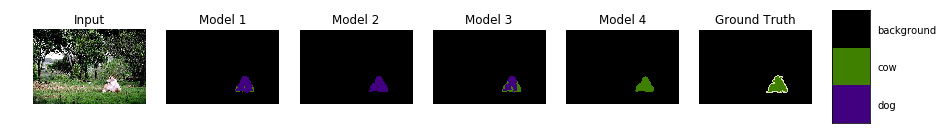

Processing sample 276 of 1449


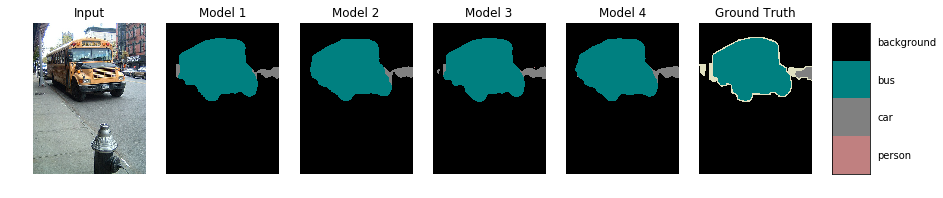

Processing sample 277 of 1449


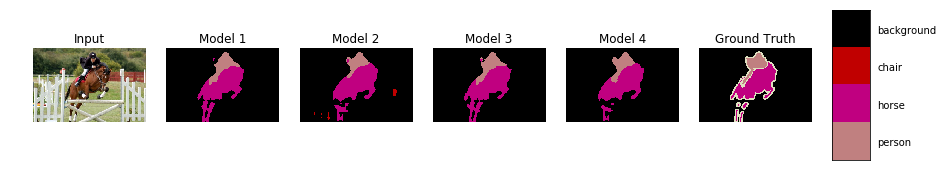

Processing sample 278 of 1449


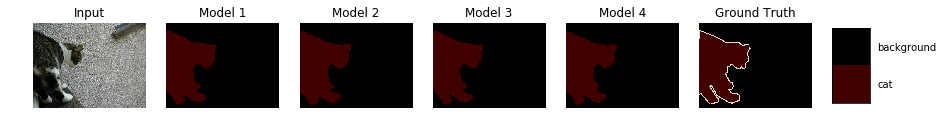

Processing sample 279 of 1449


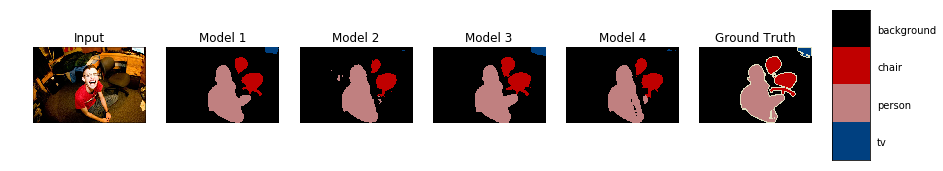

Processing sample 280 of 1449


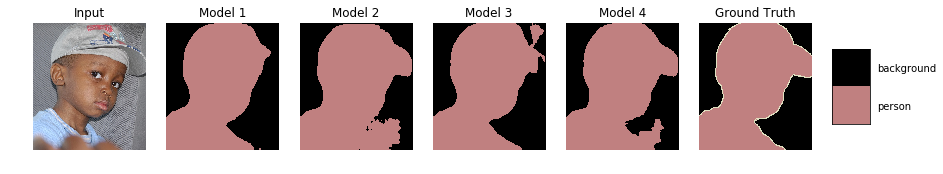

Processing sample 281 of 1449


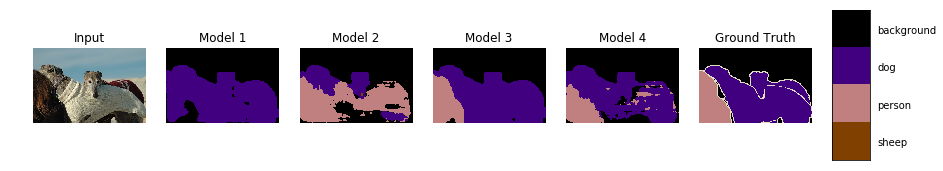

Processing sample 282 of 1449


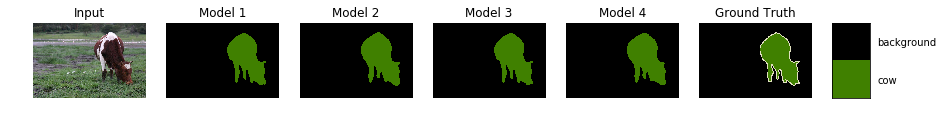

Processing sample 283 of 1449


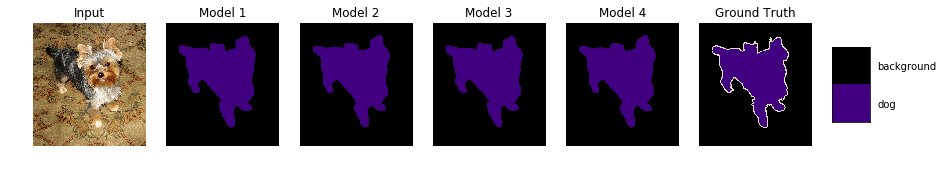

Processing sample 284 of 1449


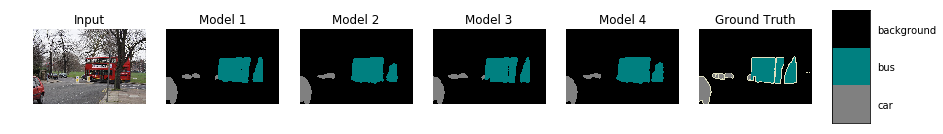

Processing sample 285 of 1449


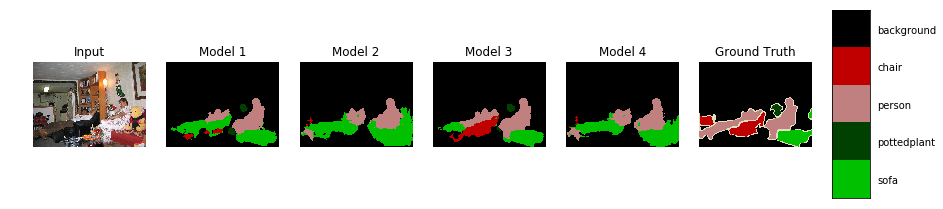

Processing sample 286 of 1449


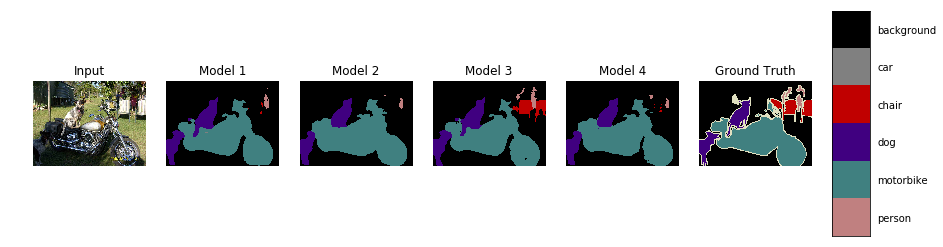

Processing sample 287 of 1449


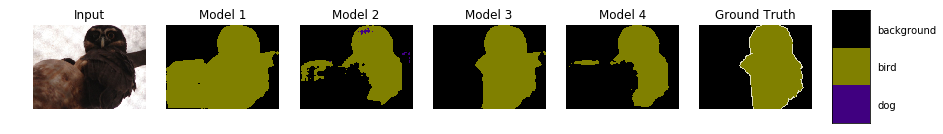

Processing sample 288 of 1449


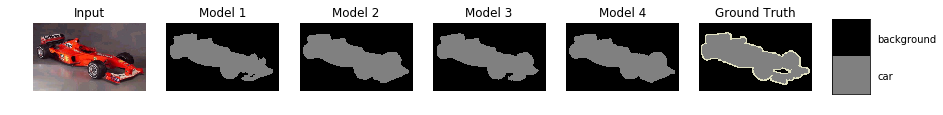

Processing sample 289 of 1449


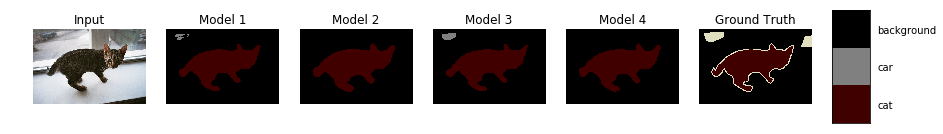

Processing sample 290 of 1449


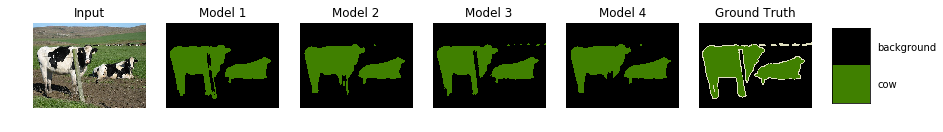

Processing sample 291 of 1449


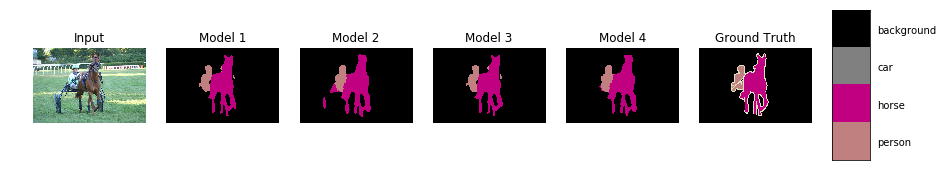

Processing sample 292 of 1449


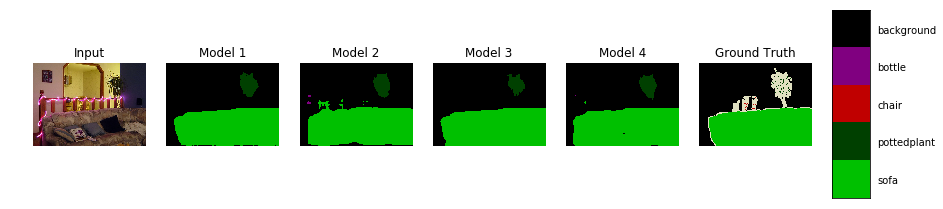

Processing sample 293 of 1449


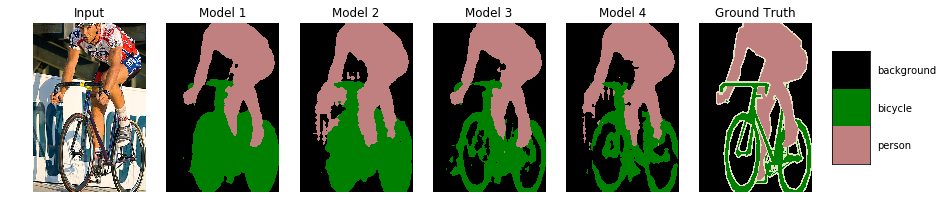

Processing sample 294 of 1449


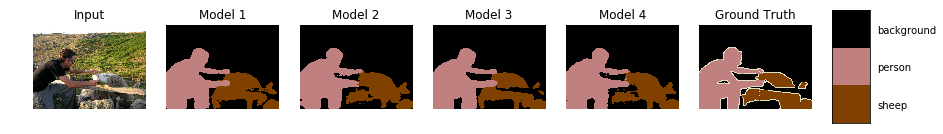

Processing sample 295 of 1449


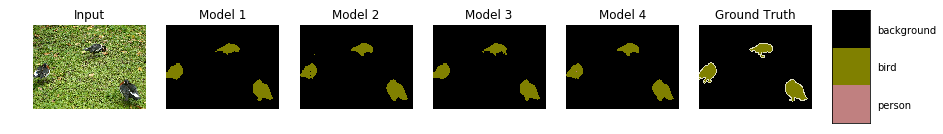

Processing sample 296 of 1449


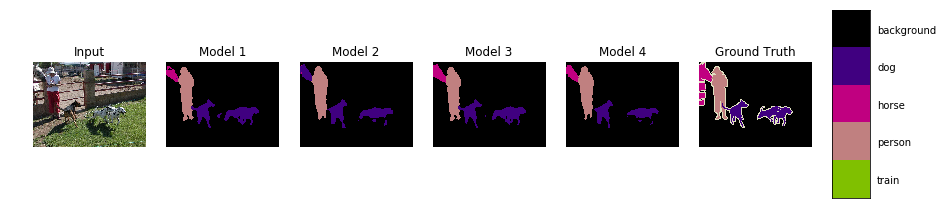

Processing sample 297 of 1449


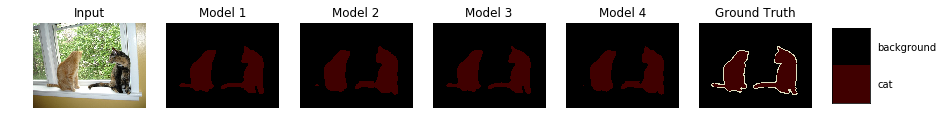

Processing sample 298 of 1449


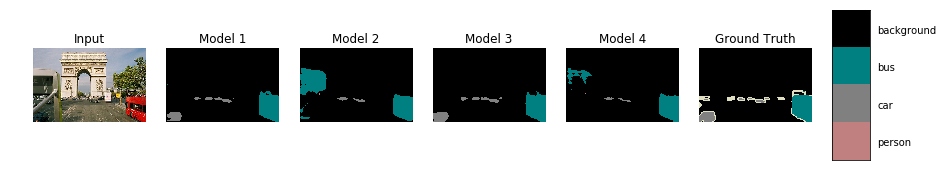

Processing sample 299 of 1449


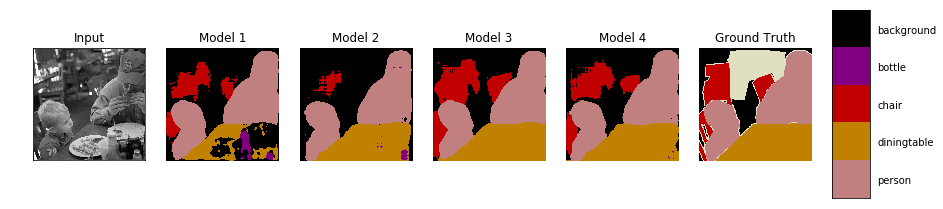

Processing sample 300 of 1449


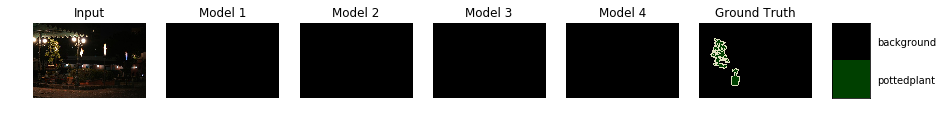

Processing sample 301 of 1449


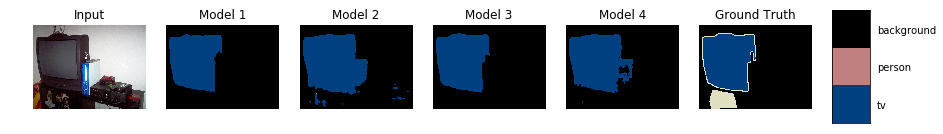

Processing sample 302 of 1449


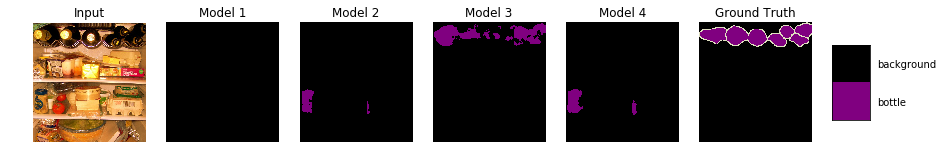

Processing sample 303 of 1449


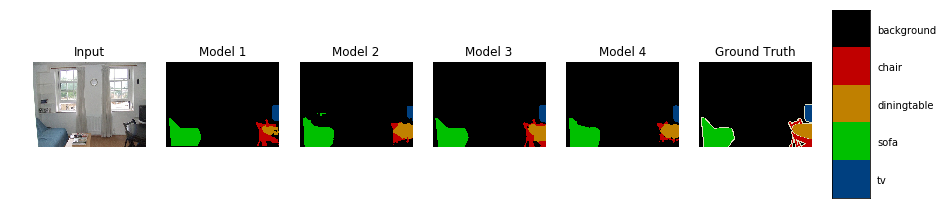

Processing sample 304 of 1449


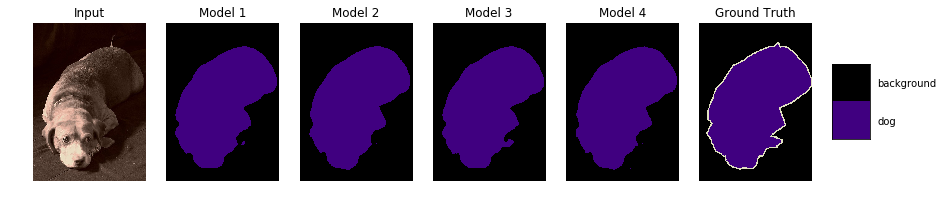

Processing sample 305 of 1449


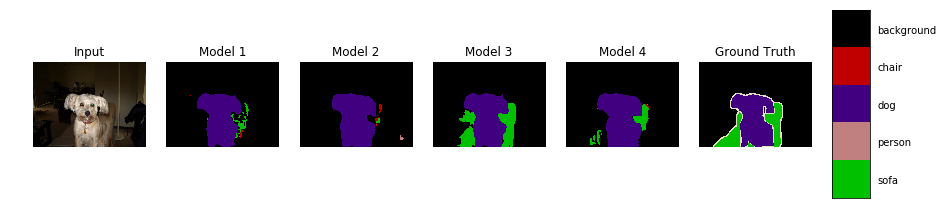

Processing sample 306 of 1449


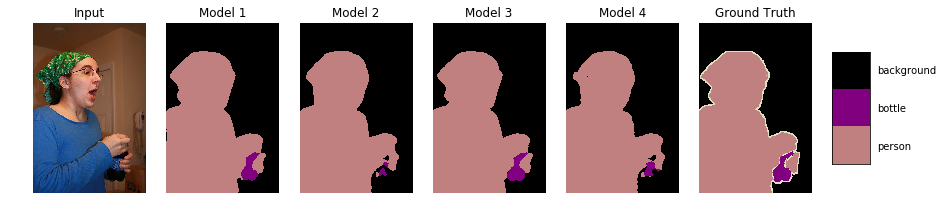

Processing sample 307 of 1449


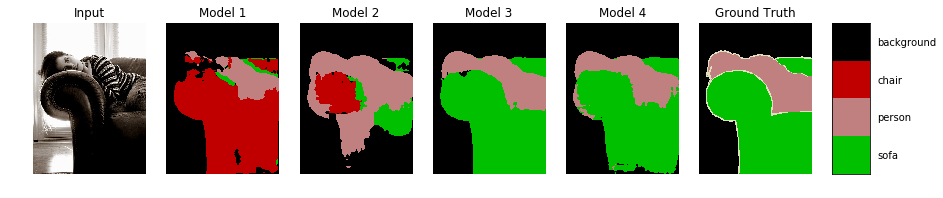

Processing sample 308 of 1449


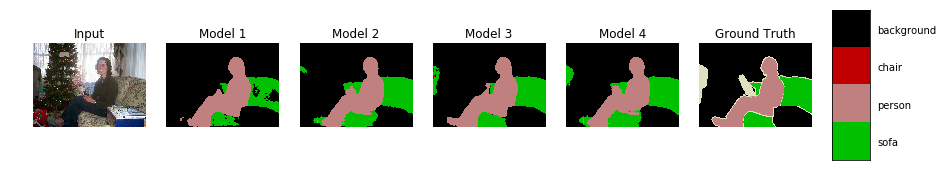

Processing sample 309 of 1449


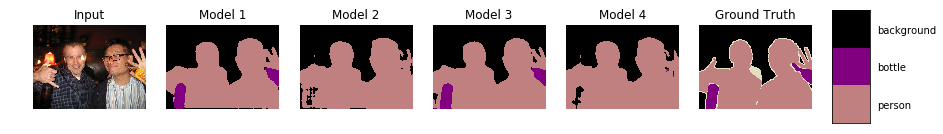

Processing sample 310 of 1449


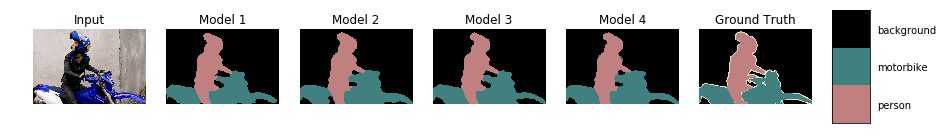

Processing sample 311 of 1449


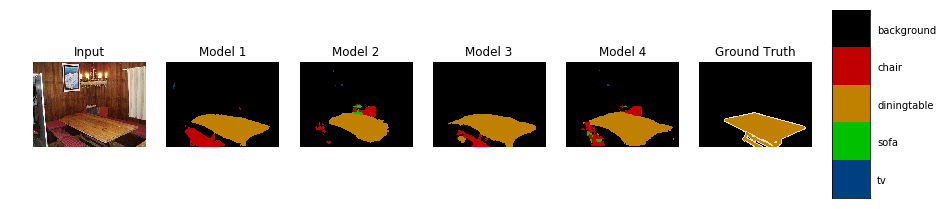

Processing sample 312 of 1449


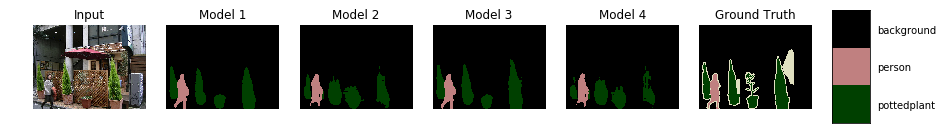

Processing sample 313 of 1449


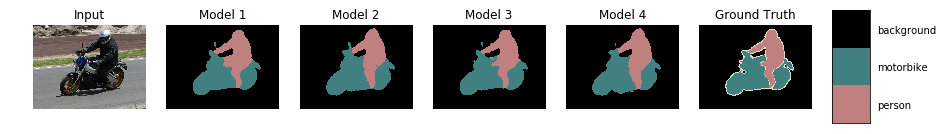

Processing sample 314 of 1449


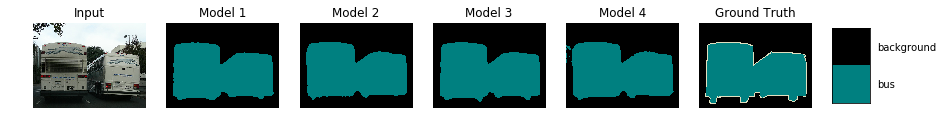

Processing sample 315 of 1449


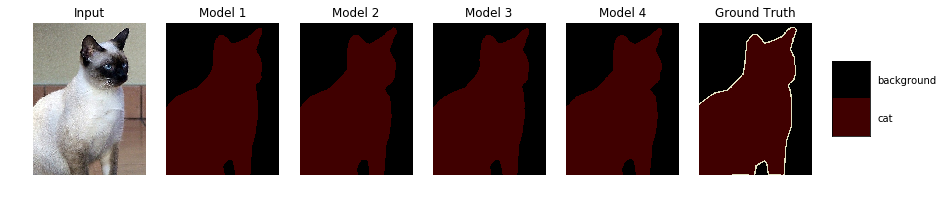

Processing sample 316 of 1449


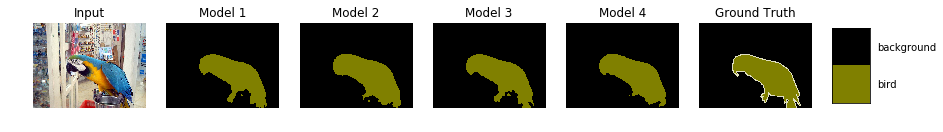

Processing sample 317 of 1449


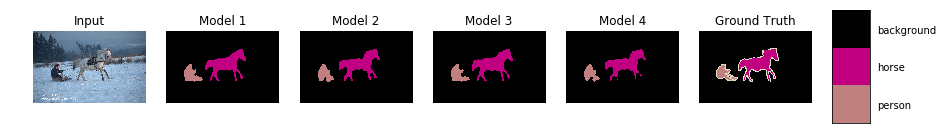

Processing sample 318 of 1449


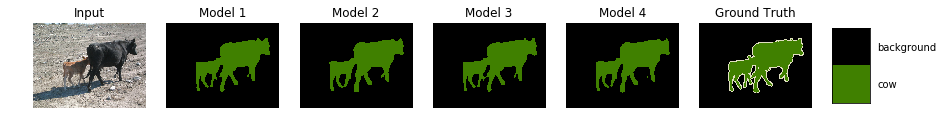

Processing sample 319 of 1449


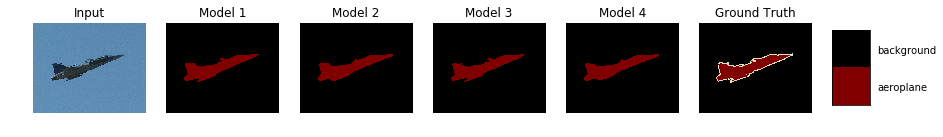

Processing sample 320 of 1449


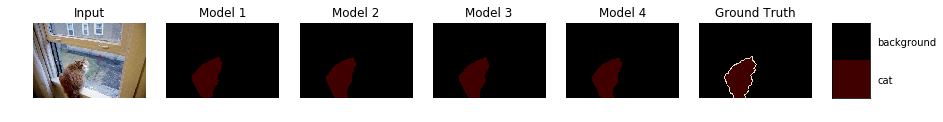

Processing sample 321 of 1449


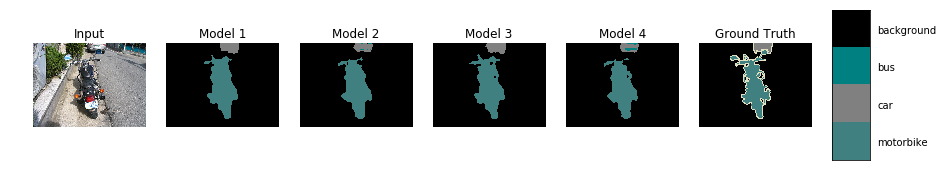

Processing sample 322 of 1449


KeyboardInterrupt: 

In [8]:
test_models(display_predictions=True) # Takes about 10 minutes for 1500 samples and 4 models (Titan V)

### Load csv and define a confidence measure
We load data that has been previously saved and define a measure of confidence. 

We are using the balanced accuracy of the model for each class in order to define the parameters

In [ ]:
def generate_parameters(folder='stats_from_dataset/'):
    modelnames = models.keys()
    labels = LABEL_NAMES
    df = {n: {l: None for l in labels} for n in modelnames}
    params = pd.DataFrame(index=[m for m in modelnames], columns=[l for l in labels])
    for name in modelnames:
        for l in labels:
            filename = folder+name+'/'+l+'.csv'
            if os.path.isfile(filename):
                df[name][l] = pd.read_csv(filename, index_col=0)
                # Balanced Accuray is 0.5*(TPR+TNR)
                tpr = df[name][l]["TP"] / (df[name][l]["TP"]+ df[name][l]["FN"])
                tnr = df[name][l]["TN"] / (df[name][l]["TN"]+ df[name][l]["FP"])
                precision = df[name][l]["TP"] / (df[name][l]["TP"]+ df[name][l]["FP"])
                score = 0.5*(tpr+tnr) # Scores for each sample
                params.loc[name][l] = score.mean()
                params.loc[name][l] = precision.mean()
    return params
params = generate_parameters()

In [ ]:
testdf["TN"]/testdf["FP"]